# Tester of all stuff I wrote in the theory folder

In [25]:
from abc import ABC, abstractmethod
from collections import defaultdict, Counter
import json
import matplotlib.pyplot as plt
from multipledispatch import dispatch
import numpy as np
import os
from scipy.stats import t as student_t
from scipy.stats import cauchy
from scipy.stats import norm
from scipy.stats import expon
from scipy.stats import bernoulli
import scipy
from typing import Type, TypeVar
from tqdm import tqdm
import time

## Algorithms for finding precise solution in case means and variances are known

In [27]:
def calc_optimal_probs_on_subsimplex(means_vars, end_range, safe_lever_exists, aversion):
    optimal_probs = np.zeros(len(means_vars))
    sigma_0 = sigma_1 = 0
    if not safe_lever_exists:
        for i in range(end_range):
            sigma_0 += 1 / (2 * aversion * means_vars[i]['var'])
            sigma_1 += means_vars[i]['mean'] / (2 * aversion * means_vars[i]['var'])
        for i in range(end_range):
            optimal_probs[means_vars[i]['idx']] = means_vars[i]['mean'] / (2 * aversion * means_vars[i]['var'])\
                                                  + (1 - sigma_1) / (sigma_0 * 2 * aversion * means_vars[i]['var'])
    else:
        probs_sum = 0
        for i in range(end_range):
            optimal_probs[means_vars[i]['idx']] = (means_vars[i]['mean'] - means_vars[end_range]['mean'])\
                / (2 * aversion * means_vars[i]['var'])
            probs_sum += optimal_probs[means_vars[i]['idx']]
        optimal_probs[means_vars[end_range]['idx']] = 1 - probs_sum
    return optimal_probs


def get_optimal_probs(means: list[float] | np.ndarray, variances: list[float] | np.ndarray, aversion: float | np.double):

    means_vars = []
    for idx, (mean, var) in enumerate(zip(means, variances)):
        means_vars.append({'idx': idx, 'mean': mean, 'var': var})
    means_vars = sorted(means_vars, key=lambda x: (-x['mean'], x['var']))

    highest_safe_lever_idx = len(means_vars)
    for i, mean_var in enumerate(means_vars):
        if mean_var['var'] == 0:
            highest_safe_lever_idx = i
            break
    
    if highest_safe_lever_idx == 0:
        optimal_probs = np.zeros(len(means))
        optimal_probs[means_vars[0]['idx']] = 1
        return optimal_probs

    safe_lever_exists = (highest_safe_lever_idx != len(means_vars))
    sigma_0 = sigma_1 = 0
    for i in range(1, highest_safe_lever_idx + 1 if safe_lever_exists else len(means_vars)):
        sigma_0 += 1 / (2 * aversion * means_vars[i - 1]['var'])
        sigma_1 += means_vars[i - 1]['mean'] / (2 * aversion * means_vars[i - 1]['var'])
        probs_sum = sigma_1 - sigma_0 * means_vars[i]['mean']
        if probs_sum >= 1:
            return calc_optimal_probs_on_subsimplex(means_vars, i, False, aversion)

    return calc_optimal_probs_on_subsimplex(means_vars, highest_safe_lever_idx, safe_lever_exists, aversion)

In [28]:
def income(means, variances, probs, aversion):
    return -np.sum(means * probs - aversion * (probs ** 2) * variances)

def income_grad(means, variances, probs, aversion):
    return -(means - 2 * aversion * probs * variances)

def cauchy_simplex_approx(means, variances, aversion):
    means = np.array(means)
    variances = np.array(variances)
    epsilon_tol = 1e-3
    stop_val = 1e-9
    probs = np.ones(len(means)) / len(means)
    func_val_old = np.inf
    func_val_new = -(np.min(means) - aversion * np.max(variances))
    t = 1
    while func_val_old - func_val_new > stop_val:
        nonzero_indices = np.argwhere(probs > epsilon_tol)
        probs_dot_grad = np.sum(probs * income_grad(means, variances, probs, aversion))
        max_grad = np.max(income_grad(means[nonzero_indices], variances[nonzero_indices], probs[nonzero_indices], aversion))
        tau_max = 1 / (max_grad - probs_dot_grad) if max_grad != probs_dot_grad else np.inf
        # print(f"tau_max: {tau_max}")
        tau = min(1 / np.sqrt(t), tau_max)
        probs -= tau * probs * (income_grad(means, variances, probs, aversion) - probs_dot_grad)
        zero_indices = np.argwhere(probs <= epsilon_tol)
        probs[zero_indices] = 0
        probs /= np.sum(probs)
        func_val_old = func_val_new
        func_val_new = income(means, variances, probs, aversion)
        t += 1
        # print(-func_val_new, -func_val_old)

    # print(t)
    return probs


2.01 

100%|██████████| 10000/10000 [00:01<00:00, 5294.08it/s]


2.03 

100%|██████████| 10000/10000 [00:01<00:00, 5422.81it/s]


2.06 

100%|██████████| 10000/10000 [00:01<00:00, 5483.60it/s]


2.1 

100%|██████████| 10000/10000 [00:01<00:00, 5414.44it/s]


2.15 

100%|██████████| 10000/10000 [00:01<00:00, 5209.72it/s]


2.21 

100%|██████████| 10000/10000 [00:01<00:00, 5146.44it/s]


2.28 

100%|██████████| 10000/10000 [00:01<00:00, 5191.33it/s]


2.36 

100%|██████████| 10000/10000 [00:01<00:00, 5190.90it/s]


2.45 

100%|██████████| 10000/10000 [00:01<00:00, 5103.88it/s]


2.55 

100%|██████████| 10000/10000 [00:01<00:00, 5085.57it/s]


2.66 

100%|██████████| 10000/10000 [00:01<00:00, 5270.32it/s]


2.78 

100%|██████████| 10000/10000 [00:01<00:00, 5399.82it/s]


2.91 

100%|██████████| 10000/10000 [00:01<00:00, 5617.42it/s]


3 

100%|██████████| 10000/10000 [00:01<00:00, 5554.50it/s]


3.2 

100%|██████████| 10000/10000 [00:01<00:00, 5608.47it/s]


3.4 

100%|██████████| 10000/10000 [00:01<00:00, 5203.32it/s]


3.6 

100%|██████████| 10000/10000 [00:01<00:00, 5136.38it/s]


3.8 

100%|██████████| 10000/10000 [00:01<00:00, 5648.88it/s]


4 

100%|██████████| 10000/10000 [00:01<00:00, 5328.95it/s]


5 

100%|██████████| 10000/10000 [00:01<00:00, 5361.48it/s]


6 

100%|██████████| 10000/10000 [00:01<00:00, 5355.75it/s]


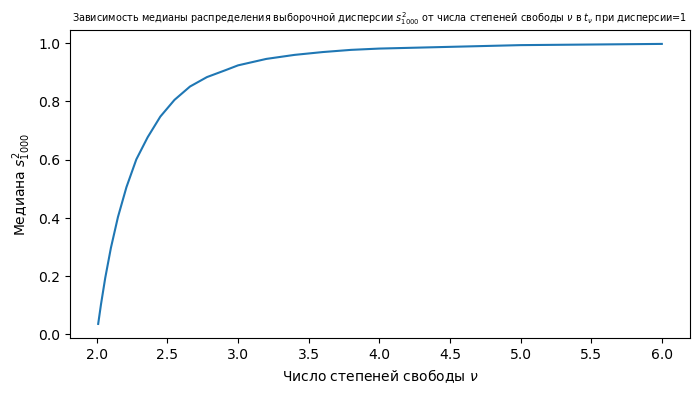

In [180]:
def plot_medians_of_sample_variance_distributions(degrees_of_freedom, test_len=1000, test_num=10000):
    medians_of_sample_variances = []
    for df in degrees_of_freedom:
        print(df, end=' ')
        sampler = student_t(df=df, loc=0, scale=np.sqrt((df - 2) / df))
        sample_variances = []
        for _ in tqdm(range(test_num)):
            samples = sampler.rvs(size=test_len)
            sample_variances.append(np.var(samples, ddof=1))
        medians_of_sample_variances.append(np.median(sample_variances))
    
    plt.figure(figsize=(8, 4))
    plt.plot(degrees_of_freedom, medians_of_sample_variances)
    plt.title(r"Зависимость медианы распределения выборочной дисперсии $s_{1000}^2$ от числа степеней свободы $\nu$ в $t_{\nu}$ при дисперсии=1", size=7)
    plt.xlabel(r"Число степеней свободы $\nu$")
    plt.ylabel(r"Медиана $s_{1000}^2$")
    plt.show()

plot_medians_of_sample_variance_distributions([2.01, 2.03, 2.06, 2.1, 2.15, 2.21, 2.28, 2.36, 2.45, 2.55, 2.66, 2.78, 2.91, 3, 3.2, 3.4, 3.6, 3.8, 4, 5, 6])
# plot_sample_variance_distribution(student_t(df=2.2, loc=1, scale=np.sqrt(1 / 11)))

100%|██████████| 100000/100000 [00:19<00:00, 5117.67it/s]


degrees of freedom: 2.1
max: 3542.1921716621537
median: 0.2958535074725013


100%|██████████| 100000/100000 [00:19<00:00, 5247.29it/s]


degrees of freedom: 3
max: 217.17538382299117
median: 0.9215754403879621


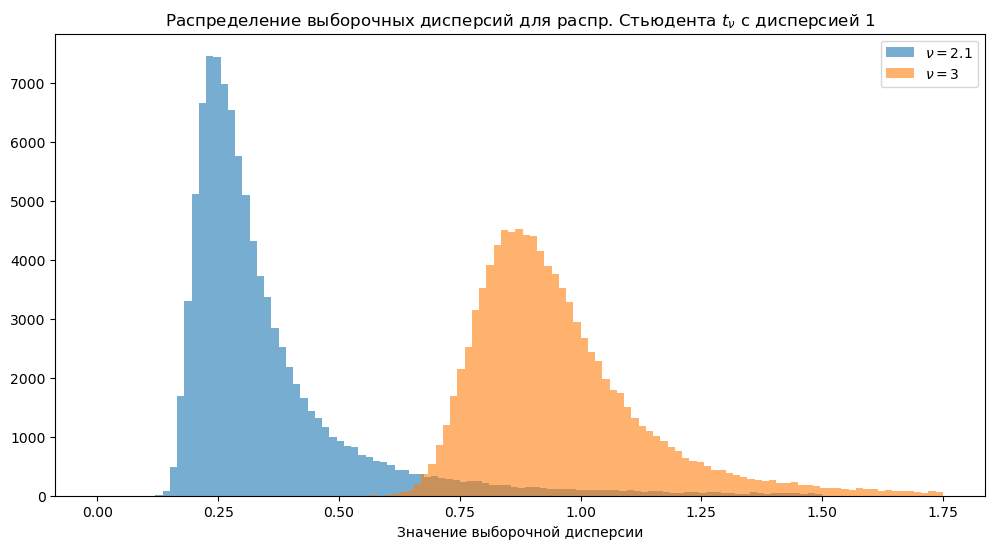

In [22]:
def get_sample_variance_distribution(df, test_len=1000, test_num=100000):
    sampler = student_t(df=df, loc=1, scale=np.sqrt((df - 2) / df))
    sample_variances = []
    for _ in tqdm(range(test_num)):
        samples = sampler.rvs(size=test_len)
        sample_variances.append(np.var(samples, ddof=1))
    print(f"degrees of freedom: {df}")
    print(f"max: {np.max(sample_variances)}")
    print(f"median: {np.median(sample_variances)}")
    return sample_variances

distr_nu_close_to_2 = get_sample_variance_distribution(df=2.1)
distr_nu_3 = get_sample_variance_distribution(df=3)

plt.figure(figsize=(12, 6))
plt.hist(distr_nu_close_to_2, bins=100, alpha=0.6, range=(0, 1.5))
plt.hist(distr_nu_3, bins=100, alpha=0.6, range=(0.25, 1.75))
plt.legend([r"$\nu=2.1$", r"$\nu=3$"])
plt.title(r"Распределение выборочных дисперсий для распр. Стьюдента $t_{\nu}$ c дисперсией 1")
plt.xlabel("Значение выборочной дисперсии")
plt.show()

In [174]:
def check_greedy_and_cauchy_simplex_algorithms(num_distrib=10, test_num=500, error_rate=0.01, aversion=1, logging_on_error=False):
    loc_sampler = norm(loc=1, scale=1)
    scale_sampler = expon(loc=0, scale=2)

    fail_cnt = 0
    cauchy_simplex_time = 0.
    greedy_time = 0.
    for _ in tqdm(range(test_num)):
        locations = loc_sampler.rvs(size=num_distrib)
        zero_scales = bernoulli(p=(num_distrib - 1) / num_distrib).rvs(size=num_distrib)
        variances = zero_scales * (scale_sampler.rvs(size=num_distrib) ** 2)

        cauchy_simplex_time_start = time.time()
        cauchy_simplex_probs = cauchy_simplex_approx(locations, variances, aversion)
        cauchy_simplex_time += (time.time() - cauchy_simplex_time_start)

        greedy_time_start = time.time()
        greedy_probs = get_optimal_probs(locations, variances, aversion)
        greedy_time += (time.time() - greedy_time_start)

        if np.any(np.abs(cauchy_simplex_probs - greedy_probs) > error_rate):
            if logging_on_error:
                print(f"Different results:\nlocations: {locations}\n variances: {variances}\ncauchy_simples result: {cauchy_simplex_probs}\ngreedy result: {greedy_probs}\n\n")
            fail_cnt += 1

    print(f"Quantity of failed tests: {100 * fail_cnt / test_num}%")
    print(f"Mean time for cauchy_simples: {round(cauchy_simplex_time / test_num * 1000, 2)} milliseconds")
    print(f"Mean time for greedy: {round(greedy_time / test_num * 1000, 2)} milliseconds")


In [175]:
check_greedy_and_cauchy_simplex_algorithms(error_rate=0.02)
check_greedy_and_cauchy_simplex_algorithms(error_rate=0.05)

100%|██████████| 500/500 [01:18<00:00,  6.33it/s]


Quantity of failed tests: 2.8%
Mean time for cauchy_simples: 156.37 milliseconds
Mean time for greedy: 0.07 milliseconds


100%|██████████| 500/500 [00:48<00:00, 10.28it/s]

Quantity of failed tests: 0.0%
Mean time for cauchy_simples: 95.91 milliseconds
Mean time for greedy: 0.06 milliseconds


## Distribution definition

In [29]:
class Distribution(ABC):
    def __init__(self, num_distrib, loc_sampler: scipy.stats.rv_continuous, scale_sampler: scipy.stats.rv_continuous, without_riskless=False):
        self.num_distrib = num_distrib
        self.locations = loc_sampler.rvs(size=num_distrib)
        self.zero_scales = np.ones(num_distrib) if without_riskless else\
            bernoulli(p=(num_distrib - 1) / num_distrib).rvs(size=num_distrib)
        self.scales = self.zero_scales * scale_sampler.rvs(size=num_distrib)
        self.distributions: list[scipy.stats.rv_continuous] = self._create_distributions()

    @abstractmethod
    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        pass

    def pull_the_lever(self, pos) -> float:
        return self.distributions[pos].rvs()  # Draw a sample from the specified distribution
    

class Gaussian(Distribution):
    def __init__(self, num_distrib, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2)):
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        return [
            norm(loc=loc, scale=scale) for loc, scale in zip(self.locations, self.scales)
        ]


class Student(Distribution):
    def __init__(self, num_distrib, mu, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2), need_scale=True):
        self.need_scale = need_scale
        self.mu = mu  # degrees of freedom for Student's t distribution
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        normalize_scale = np.sqrt((self.mu - 2) / self.mu) if self.need_scale and self.mu > 2 else 1
        return [
            student_t(df=self.mu, loc=loc, scale=normalize_scale*scale) for loc, scale in zip(self.locations, self.scales)
        ]


class Cauchy(Distribution):
    def __init__(self, num_distrib, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2)):
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        return [
            cauchy(loc=loc, scale=scale) for loc, scale in zip(self.locations, self.scales)
        ]

## Strategy and bandit tester definition

In [30]:
class Strategy(ABC):
    def __init__(self, num_arms, step_size):
        self.num_arms = num_arms
        self.q_values = np.zeros(num_arms) # Initialize Q-values
        self.counts = np.zeros(num_arms)  # Track visits per arm
        self.step_size = step_size

    @abstractmethod
    def choose_arm(self) -> tuple[int, np.ndarray]:
        pass

    @abstractmethod
    def update(self, arm, reward):
        pass


class AversionStrategy(Strategy):
    def __init__(self, num_arms, step_size, aversion):
        super().__init__(num_arms, step_size)
        self.q_square_values = np.zeros(num_arms)
        self.s_values = np.zeros(num_arms) # Initialize Sigma-values
        self.probs = np.ones(num_arms) / num_arms # Initialize probabilities for choosing each arm
        self.aversion = aversion

    def _update_counts_and_q_values(self, arm, reward):
        self.counts[arm] += 1
        self.q_values[arm] = self.q_values[arm] + self.step_size(self.counts[arm]) * (reward - self.q_values[arm])
        self.q_square_values[arm] = self.q_square_values[arm] +\
            self.step_size(self.counts[arm]) * (reward ** 2 - self.q_square_values[arm])

    def _update_counts_q_and_s_values(self, arm, reward):
        self._update_counts_and_q_values(arm, reward)
        self.s_values[arm] = 0 if self.counts[arm] <= 1 else (self.counts[arm] / (self.counts[arm] - 1)) *\
            (self.q_square_values[arm] - self.q_values[arm] ** 2)
        
    def get_aversion_reward_metric(self):
        return np.sum(self.probs * self.q_values - self.aversion * (self.probs ** 2) * self.s_values)


In [31]:
class BanditTester:
    def __init__(self, distribution: Type[Distribution], strategy: Type[Strategy], distribution_params: dict, strategy_params: dict, num_arms=10, test_num=2000, test_len=1000):
        np.random.seed(42)
        self.distribution = distribution
        self.strategy = strategy
        self.distribution_params = dict(distribution_params)
        self.distribution_params["num_distrib"] = num_arms
        self.strategy_params = dict(strategy_params)
        self.strategy_params["num_arms"] = num_arms
        self.test_num = test_num
        self.test_len = test_len

        self.average_rewards = np.zeros(self.test_len)
        self.optimal_actions = np.zeros(self.test_len)

        self.metric_results = {}
        self.metric_results['average_rewards'] = np.zeros(self.test_len)
        self.metric_results['optimal_actions'] = np.zeros(self.test_len)

    def _make_one_step(self, strategy: Strategy, distribution: Distribution) -> tuple[int, float, np.ndarray]:
        arm, probs = strategy.choose_arm()
        reward = distribution.pull_the_lever(arm)
        strategy.update(arm, reward)

        return arm, reward, probs
    
    def _get_max_reward(self, distribution: Distribution):
        return np.max(distribution.locations)
    
    def _test_one_test(self, strategy: Strategy, distribution: Distribution):
        optimal_arm = np.argmax(distribution.locations)  # Determine the optimal arm

        for i in range(self.test_len):
            arm, reward, _ = self._make_one_step(strategy, distribution)

            self.metric_results['average_rewards'][i] += reward / self.test_num
            self.metric_results['optimal_actions'][i] += int(arm == optimal_arm) / self.test_num

    def test(self) -> dict[str, np.ndarray]:
        for _ in tqdm(range(self.test_num)):
            strategy = self.strategy(**self.strategy_params)  # Create a new strategy instance for each run
            distribution = self.distribution(**self.distribution_params)  # Create a new distribution instance for each run

            self._test_one_test(strategy, distribution)

        return self.metric_results


class AversionBanditTester(BanditTester):
    def __init__(self,
                 distribution: Type[Distribution],
                 strategy: Type[AversionStrategy],
                 distribution_params,
                 strategy_params,
                 aversion=1,
                 num_arms=10,
                 test_num=2000,
                 test_len=1000):
        super().__init__(distribution, strategy, distribution_params, strategy_params, num_arms, test_num, test_len)
        if 'aversion' not in strategy_params.keys():
            self.aversion = aversion
            self.strategy_params['aversion'] = aversion
        else:
            self.aversion = self.strategy_params['aversion']

        self.metric_results['average_regrets'] = np.zeros(self.test_len)
        self.metric_results['real_average_rewards'] = np.zeros(self.test_len)
        self.metric_results['real_average_regrets'] = np.zeros(self.test_len)

        # self.metric_results['last_real_regrets'] = []

    def _get_opt_actions_metric(self, pred_probs, optimal_probs):
        return 1 - np.sum(np.abs(pred_probs - optimal_probs)) / 2
    
    def _get_aversion_reward_metric(self, strategy: AversionStrategy):
        return strategy.get_aversion_reward_metric()
    
    def _get_max_aversion_reward(self, distribution: Distribution, optimal_probs):
        return np.sum(optimal_probs * distribution.locations - self.aversion * (optimal_probs ** 2) * (distribution.scales ** 2))

    def _test_one_test(self, strategy: AversionStrategy, distribution: Distribution):
        optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, self.aversion)
        max_reward = self._get_max_aversion_reward(distribution, optimal_probs)
        # min_prob = np.min(optimal_probs)

        window = 5
        sum_of_last_real_regrets = 0.

        for i in range(self.test_len):
            _, _, pred_probs = self._make_one_step(strategy, distribution)
            reward_as_strategy_expects = self._get_aversion_reward_metric(strategy)
            real_reward = self._get_max_aversion_reward(distribution, strategy.probs)

            self.metric_results['average_rewards'][i] += reward_as_strategy_expects / self.test_num
            self.metric_results['optimal_actions'][i] += self._get_opt_actions_metric(pred_probs, optimal_probs) / self.test_num
            self.metric_results['average_regrets'][i] += (max_reward - reward_as_strategy_expects) / self.test_num
            self.metric_results['real_average_rewards'][i] += real_reward / self.test_num
            self.metric_results['real_average_regrets'][i] += (max_reward - real_reward) / self.test_num

            if self.test_len - i <= window:
                sum_of_last_real_regrets += max_reward - real_reward

        self.metric_results['last_real_regrets'].append(sum_of_last_real_regrets / window)
            
        # print(f"diff means: {strategy.q_values - distribution.locations}")
        # print(f"diff variances: {strategy.s_values / (distribution.scales * distribution.scales)}")
        # print(f"expected probs: {strategy.probs}")
        # print(f"counts to choose: {strategy.counts}")

## Comparing strategies and aversions definition

In [32]:
avg_reward_metric = "Average aversion reward"
real_avg_reward_metric = "Real average aversion reward"
opt_action_metric = "% Optimal Action Metric"
avg_regret_metric = "Average aversion regret"
real_avg_regret_metric = "Real average aversion regret"

InheritorsOfDistr = TypeVar('InheritorsOfDistr', bound=Distribution)
InheritorsOfAversStrat = TypeVar('InheritorsOfAversStrat', bound=AversionStrategy)

In [33]:
def compare_strategies(distributions: list[type[InheritorsOfDistr]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategies: list[type[InheritorsOfAversStrat]],
                       strategies_params: list[dict]):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for strategy, strategy_params in zip(strategies, strategies_params):
            bandit_tester = AversionBanditTester(distribution, strategy, distribution_params, strategy_params)
            metrics = bandit_tester.test()

            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics
        

In [34]:
def compare_aversions(distributions: list[type[InheritorsOfDistr]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategy: type[AversionStrategy],
                       strategy_params: dict,
                       aversions: list | np.ndarray):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for aversion in aversions:
            print(f"aversion: {aversion}")
            bandit_tester = AversionBanditTester(distribution, strategy, distribution_params, strategy_params, aversion=aversion)
            metrics = bandit_tester.test()
    
            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics


In [35]:
distributions = [Gaussian, Student, Student, Student]
distributions_params = [ {}, {'mu': 3}, {'mu': 2.1}, {'mu': 2}]
distributions_names = ["Normal", "Student with "+r"$\nu=3$", "Student with "+r"$\nu=2.1$", "Student with "+r"$\nu=2$"]
aversions = np.array([0.01, 0.05, 0.12, 0.3, 0.6, 1, 2, 4, 10])

## Save the metrics

In [36]:
all_metrics_path = "all_metrics.json"

def save_new_metrics(metrics, test_key):
    if os.path.exists(all_metrics_path):
        # read existing file and append new data
        with open(all_metrics_path,"r") as f:
            all_metrics = json.load(f)
    else:
        # create new json
        all_metrics = {}

    all_metrics[test_key] = metrics
    with open(all_metrics_path, "w") as write_file:
        json.dump(all_metrics, write_file)

In [37]:
def load_all_metrics():
    with open(all_metrics_path,"r") as f:
        return json.load(f)

## Functions for plotting and saving results

### For checking strategies

In [38]:
metrics_titles = [avg_regret_metric, real_avg_regret_metric, opt_action_metric]
metrics_names = ['average_regrets', 'real_average_regrets', 'optimal_actions']

In [40]:
def plot_strategies_results(metrics, labels, set_ylim=lambda key, i, axes_flat: None, set_legend_outside=False):

    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 2 columns)
    fig, axes = plt.subplots(len(metrics), 3, figsize=(18, 4 * len(metrics)))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle("Performance of Strategies", fontsize=18)
    for ax in axes_flat:
        ax.set_xlabel("Steps", size=12)

    # Loop through each key (distribution)
    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            for label, data in zip(labels, metrics[key][metric_name]):
                axes_flat[3 * i + k].plot(steps,
                                          data if metric_name != 'optimal_actions' else [100 * x for x in data],
                                          label=label)
                
        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{key} - {metric_title}", size=12)
            axes_flat[3 * i + k].set_ylabel(metric_title, size=12)
            if set_legend_outside is False:
                axes_flat[3 * i + k].legend()

        set_ylim(key, i, axes_flat)

    if set_legend_outside is True:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.5,-0.07), loc='lower center', ncol=len(labels) // 2, prop={'size': 20})
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()


In [41]:
def plot_distributions_results(metrics, labels, set_ylim=lambda label, i, axes_flat: None):

    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 3 columns)
    fig, axes = plt.subplots(len(labels), 3, figsize=(18, 4 * len(labels)))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle("Performance of Strategies", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    for i, label in enumerate(labels):
        for key in metrics.keys():
            for k, metric_name in enumerate(metrics_names):
                axes_flat[3 * i + k].plot(steps,
                                          metrics[key][metric_name][i] if metric_name != 'optimal_actions'
                                          else [100 * x for x in metrics[key][metric_name][i]],
                                          label=key)

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{label} - {metric_title}")
            axes_flat[3 * i + k].set_ylabel(metric_title)
            axes_flat[3 * i + k].legend()
            
        set_ylim(label, i, axes_flat)
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

### For checking aversions

In [42]:
def plot_aversion_depend_on_distribution_results(metrics, aversions, strategy_name, set_ylim=lambda label, i, axes_flat: None):
    
    # Define x-axis (steps)
    steps = list(range(1, 1001))

    fig, axes = plt.subplots(len(metrics), 3, figsize=(17, 4 * len(metrics)))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle(f"Performance via aversion for {strategy_name}", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    # Loop through each key (distribution)
    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            for aversion_label, data in zip(aversions, metrics[key][metric_name]):
                axes_flat[3 * i + k].plot(steps,
                                          data if metric_name != 'optimal_actions' else [100 * x for x in data],
                                          label=f"aversion: {str(aversion_label)}")

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{metric_title}, {key}")
            axes_flat[3 * i + k].set_ylabel(metric_title)

        set_ylim(key, i, axes_flat)
        
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, bbox_to_anchor=(0.5,-0.25), loc='lower center', ncol=len(labels) // 2, prop={'size': 20})
    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

In [43]:
def plot_results_via_aversions(metrics, aversions, strategy_name, set_ylim=lambda label, i, axes_flat: None, aversion_ids=None):
    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 2 columns)
    plots_num = len(aversions) if aversion_ids is None else len(aversion_ids)
    fig, axes = plt.subplots(plots_num, 3, figsize=(18, 4 * plots_num))
    

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle(f"Performance via aversions for {strategy_name}", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    aversions_to_plot = aversions if aversion_ids is None else aversions[aversion_ids]
    ids_to_plot = np.arange(len(aversions)) if aversion_ids is None else aversion_ids
    for i, aversion_label in enumerate(aversions_to_plot):
        for key in metrics.keys():
            if key != "Student with "+r"$\nu=2$":
                for k, metric_name in enumerate(metrics_names):
                    axes_flat[3 * i + k].plot(steps,
                                            metrics[key][metric_name][ids_to_plot[i]] if metric_name != 'optimal_actions'
                                            else [100 * x for x in metrics[key][metric_name][ids_to_plot[i]]],
                                            label=key)
                
        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"aversion={str(aversion_label)} - {metric_title}")
            axes_flat[3 * i + k].set_ylabel(metric_title)
            axes_flat[3 * i + k].legend()

        set_ylim(aversion_label, i, axes_flat)
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

In [44]:
def plot_last_results_depending_on_aversion(metrics, aversions, strategy_name):
    fig, axes = plt.subplots(len(metrics), 3, figsize=(18, 4 * len(metrics)))

    axes_flat = axes.flatten()

    fig.suptitle(f"Performance via aversions on the last 5 steps for {strategy_name}, log scale", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Aversion", size=12)

    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            values = []
            for data in metrics[key][metric_name]:
                values.append(np.mean(np.array(data[-5:])))
            axes_flat[3 * i + k].plot(aversions,
                                      values if metric_name != 'optimal_actions' else [100 * x for x in values])

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{metric_title}, {key}", size=12)
            axes_flat[3 * i + k].set_ylabel(metric_title, size=12)
            axes_flat[3 * i + k].set_xscale('log')
            axes_flat[3 * i + k].set_xticks(aversions, [str(aversion) for aversion in aversions])
    
    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

In [45]:
def plot_aversion_comparison_between_strategies(folders_names: list[str], aversions: list[float], strategies_names: list[str]):
    fig, axes = plt.subplots(len(distributions), 3, figsize=(17, 4 * len(distributions)))
    axes_flat = axes.flatten()

    all_strategies = ", and ".join(strategies_names)
    fig.suptitle(rf"Performance via aversions on the last 5 steps for {all_strategies}, log scale", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Aversion", size=12)

    all_metrics = load_all_metrics()
    for i, key in enumerate(all_metrics[folders_names[0]].keys()):
        for k, metric_name in enumerate(metrics_names):
            for folder_name, strategy_name in zip(folders_names, strategies_names):
                values = []
                for data in all_metrics[folder_name][key][metric_name]:
                    values.append(np.mean(np.array(data[-5:])))
                axes_flat[3*i+k].plot(aversions, values if metric_name != 'optimal_actions' else [100 * x for x in values], label=strategy_name)

            axes_flat[3*i+k].legend()
            for k, metric_title in enumerate(metrics_titles):
                axes_flat[3*i+k].set_title(f"{metric_title}, {key}", size=12)
                axes_flat[3*i+k].set_ylabel(metric_title, size=12)
                axes_flat[3*i+k].set_xscale('log')
                axes_flat[3*i+k].set_xticks(aversions, [str(aversion) for aversion in aversions])

    plt.tight_layout()
    plt.show()

## Greedy and $\epsilon$-greedy

In [46]:
class EpsilonGreedy(AversionStrategy):
    def __init__(self, num_arms, epsilon=0.1, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.epsilon = epsilon

    def choose_arm(self) -> tuple[int, np.ndarray]:
        if np.random.random() < self.epsilon:
            # Explore: choose random arm
            return np.random.randint(0, self.num_arms), np.ones(self.num_arms) / self.num_arms
        else:
            if np.any(self.probs < 0):
               print(self.probs)
               print(f"q: {self.q_values}")
               print(f"q_square: {self.q_square_values}")
               print(f"s:{self.s_values}")
            arm = np.random.choice(np.arange(self.num_arms), p=self.probs)
            return arm, self.probs

    def update(self, arm, reward):
        self._update_counts_q_and_s_values(arm, reward)

        self.probs = get_optimal_probs(self.q_values, self.s_values, self.aversion)
        self.probs /= np.sum(self.probs) # Normalization for numpy.random.choice correct work


class Greedy(EpsilonGreedy):
    def __init__(self, num_arms, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, epsilon=0, step_size=step_size, aversion=aversion)

In [32]:
strategies = [Greedy, EpsilonGreedy, EpsilonGreedy]
strategies_params = [{}, {'epsilon': 0.01}, {'epsilon': 0.1}]

In [556]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, EpsilonGreedy, {'epsilon': 0.1}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [06:49<00:00,  4.88it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:34<00:00,  5.07it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:40<00:00,  4.99it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:48<00:00,  4.90it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


aversion: 1


100%|██████████| 2000/2000 [06:49<00:00,  4.88it/s]


aversion: 2


100%|██████████| 2000/2000 [06:26<00:00,  5.17it/s]


aversion: 4


100%|██████████| 2000/2000 [06:31<00:00,  5.11it/s]


aversion: 10


100%|██████████| 2000/2000 [06:10<00:00,  5.40it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [07:01<00:00,  4.74it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:27<00:00,  4.47it/s]


aversion: 0.12


100%|██████████| 2000/2000 [07:30<00:00,  4.44it/s]


aversion: 0.3


100%|██████████| 2000/2000 [07:35<00:00,  4.39it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:38<00:00,  4.36it/s]


aversion: 1


100%|██████████| 2000/2000 [07:43<00:00,  4.31it/s]


aversion: 2


100%|██████████| 2000/2000 [07:28<00:00,  4.46it/s]


aversion: 4


100%|██████████| 2000/2000 [06:56<00:00,  4.81it/s]


aversion: 10


100%|██████████| 2000/2000 [06:53<00:00,  4.84it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:43<00:00,  4.96it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:14<00:00,  5.34it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:32<00:00,  5.10it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:21<00:00,  5.24it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:15<00:00,  5.33it/s]


aversion: 1


100%|██████████| 2000/2000 [06:18<00:00,  5.29it/s]


aversion: 2


100%|██████████| 2000/2000 [06:20<00:00,  5.26it/s]


aversion: 4


100%|██████████| 2000/2000 [06:18<00:00,  5.28it/s]


aversion: 10


100%|██████████| 2000/2000 [06:20<00:00,  5.26it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [06:14<00:00,  5.35it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:16<00:00,  5.31it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:17<00:00,  5.30it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:17<00:00,  5.30it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:19<00:00,  5.27it/s]


aversion: 1


100%|██████████| 2000/2000 [06:19<00:00,  5.27it/s]


aversion: 2


100%|██████████| 2000/2000 [06:22<00:00,  5.22it/s]


aversion: 4


100%|██████████| 2000/2000 [06:26<00:00,  5.18it/s]


aversion: 10


100%|██████████| 2000/2000 [06:26<00:00,  5.18it/s]


In [557]:
save_new_metrics(aversion_metrics, 'eps_greedy_aversions_test')

In [595]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.8)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.6)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.75)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(None, 0.4)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.1, None)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.75)

In [24]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

In [550]:
print(all_metrics['eps_greedy_aversions_test']['Normal'].keys())

dict_keys(['average_rewards', 'optimal_actions', 'average_regrets', 'real_average_rewards', 'real_average_regrets'])


In [55]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.3)
        axes_flat[3 * i + 1].set_ylim(0, 0.3)
        axes_flat[3 * i + 2].set_ylim(45, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.4)
        axes_flat[3 * i + 1].set_ylim(0, 0.2)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(None, 0.25)
        axes_flat[3 * i + 1].set_ylim(0, 1)
        axes_flat[3 * i + 2].set_ylim(55, None)

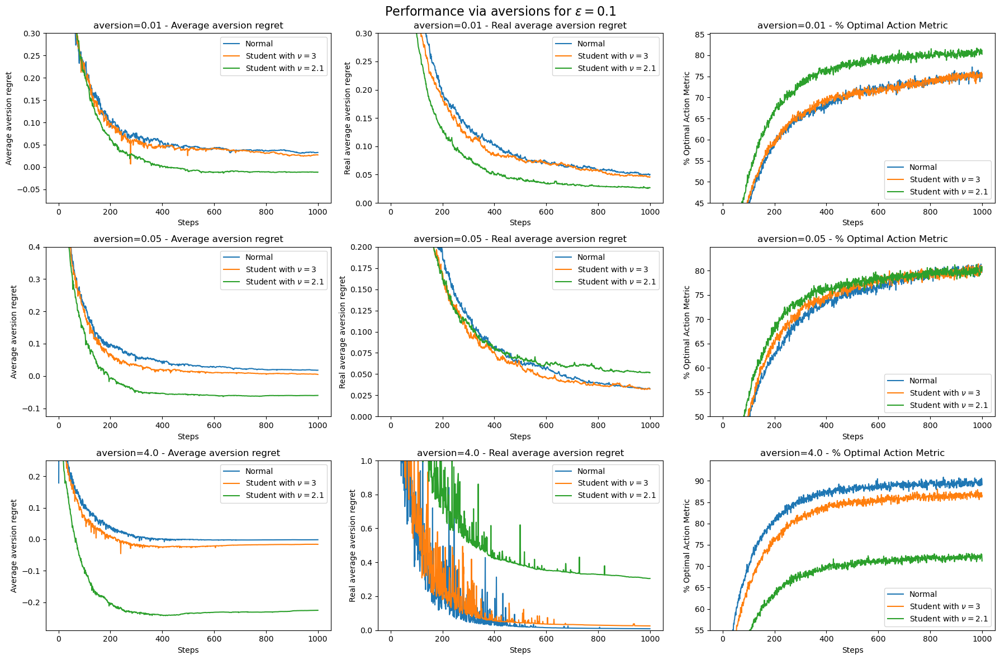

In [56]:
plot_results_via_aversions(all_metrics['eps_greedy_aversions_test'], aversions, r"$\epsilon = 0.1$", aversion_ids=[0, 1, 7], set_ylim=set_ylim)

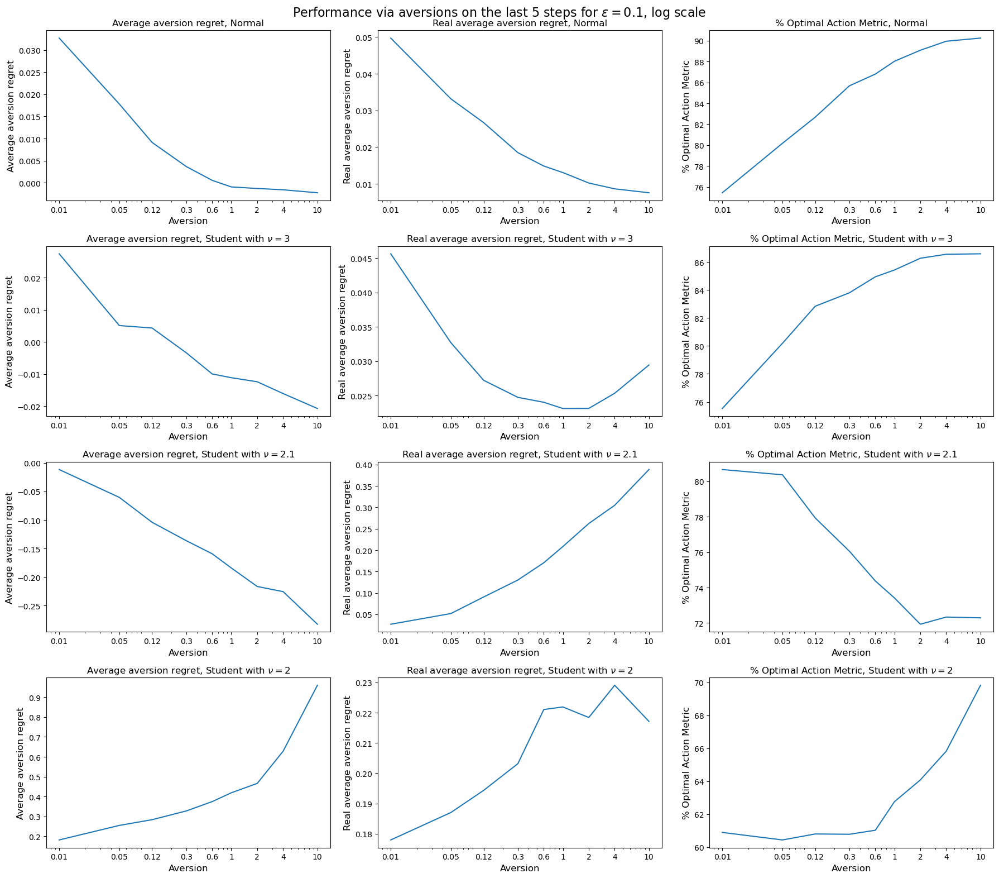

In [561]:
plot_last_results_depending_on_aversion(all_metrics['eps_greedy_aversions_test'], aversions, r"$\epsilon = 0.1$")

In [503]:
print(aversion_metrics['Normal']['optimal_actions'][-1][-5:])

[0.581482107138175, 0.5873232704604803, 0.5874058937312223, 0.6095779420206527, 0.5900631405725797]


In [332]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [333]:
save_new_metrics(metrics, 'eps_greedy_test')

In [371]:
labels = [r"$\epsilon = 0$ (greedy)", r"$\epsilon = 0.01$", r"$\epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 3:
        axes_flat[3 * i].set_ylim(0.2, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 1.75)  # Set y-axis limits for optimal action to [15, 90]

def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(18, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 2)
    if i == 0:
        axes_flat[3 * i].set_ylim(0.55, 0.8)
        axes_flat[3 * i + 1].set_ylim(0.25, 2)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.8)
    else:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.)

In [25]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

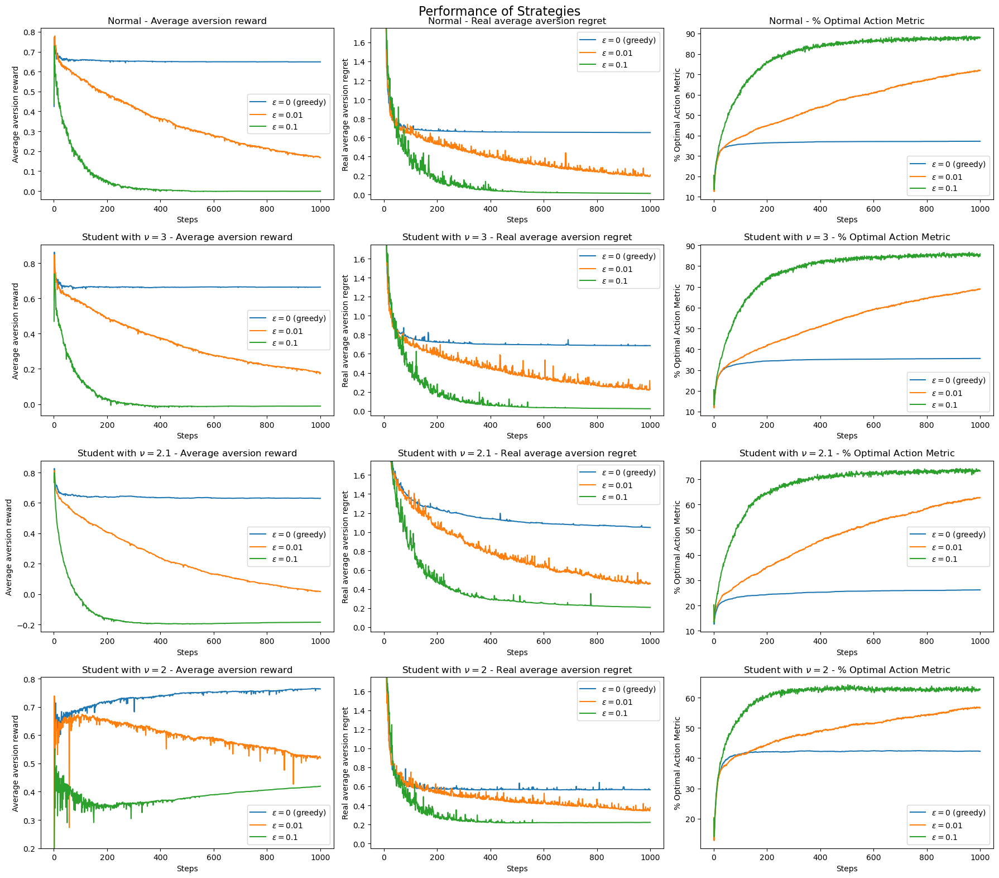

In [374]:
plot_strategies_results(metrics,
                        labels,
                        set_ylim)

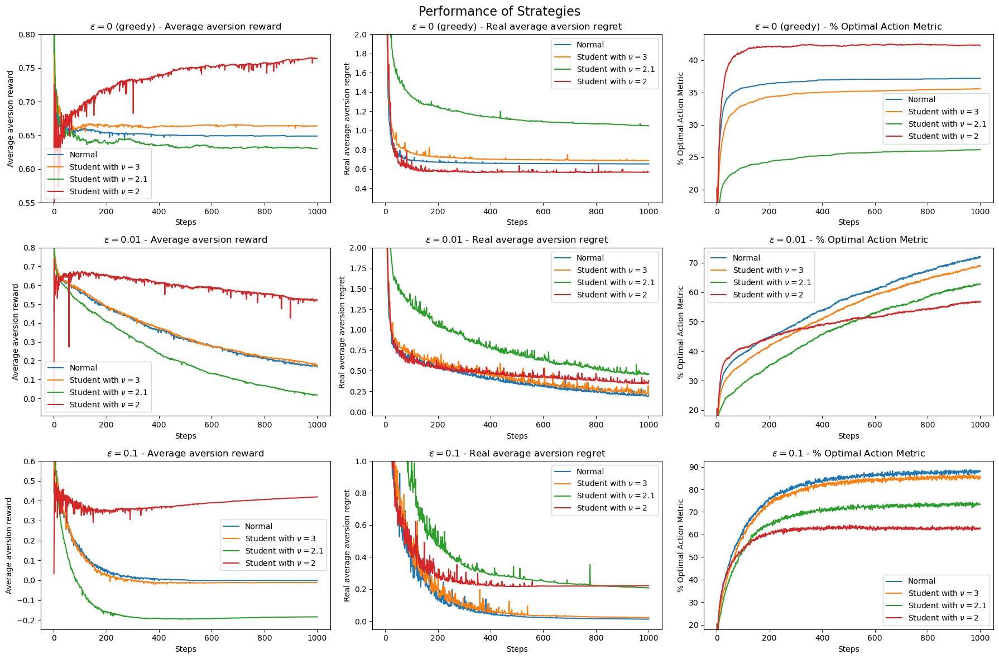

In [372]:
plot_distributions_results(metrics,
                           labels,
                           set_ylim=set_label_ylim)

### Subjective test of $\epsilon$-greedy

In [21]:
class SubjectiveAversionBanditTester(AversionBanditTester):
    def __init__(self,
                 distribution: Type[Distribution],
                 strategy: Type[AversionStrategy],
                 distribution_params,
                 strategy_params,
                 aversion=1,
                 num_arms=10,
                 test_num=2000,
                 test_len=1000):
        super().__init__(distribution, strategy, distribution_params, strategy_params, aversion, num_arms, test_num, test_len)

    def _get_aversion_reward_metric(self, strategy: AversionStrategy, pred_probs):
        return np.sum(pred_probs * strategy.q_values - self.aversion * (pred_probs ** 2) * strategy.s_values)

    def _test_one_test(self, strategy: AversionStrategy, distribution: Distribution):
        optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, self.aversion)
        max_reward = self._get_max_aversion_reward(distribution, optimal_probs)
        # min_prob = np.min(optimal_probs)

        for i in range(self.test_len):
            _, _, pred_probs = self._make_one_step(strategy, distribution)
            reward_as_strategy_expects = self._get_aversion_reward_metric(strategy, pred_probs)
            real_reward = self._get_max_aversion_reward(distribution, pred_probs)

            self.metric_results['average_rewards'][i] += reward_as_strategy_expects / self.test_num
            self.metric_results['optimal_actions'][i] += self._get_opt_actions_metric(pred_probs, optimal_probs) / self.test_num
            self.metric_results['average_regrets'][i] += (max_reward - reward_as_strategy_expects) / self.test_num
            self.metric_results['real_average_rewards'][i] += real_reward / self.test_num
            self.metric_results['real_average_regrets'][i] += (max_reward - real_reward) / self.test_num
            

In [22]:
def compare_subjective_strategies(distributions: list[type[InheritorsOfDistr]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategies: list[type[InheritorsOfAversStrat]],
                       strategies_params: list[dict]):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for strategy, strategy_params in zip(strategies, strategies_params):
            bandit_tester = SubjectiveAversionBanditTester(distribution, strategy, distribution_params, strategy_params)
            metrics = bandit_tester.test()

            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics
        

In [37]:
metrics = compare_subjective_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal


100%|██████████| 2000/2000 [06:52<00:00,  4.85it/s]


Student with $\nu=3$


100%|██████████| 2000/2000 [06:57<00:00,  4.79it/s]


Student with $\nu=2.1$


100%|██████████| 2000/2000 [06:48<00:00,  4.90it/s]


Student with $\nu=2$


100%|██████████| 2000/2000 [06:45<00:00,  4.94it/s]


In [38]:
save_new_metrics(metrics, 'eps_greedy_subjective_test')

In [39]:
labels = [r"$\epsilon = 0$ (greedy)", r"$\epsilon = 0.01$", r"$\epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 3:
        axes_flat[3 * i].set_ylim(0.2, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 1.75)  # Set y-axis limits for optimal action to [15, 90]

def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(18, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 2)
    if i == 0:
        axes_flat[3 * i].set_ylim(0.55, 0.8)
        axes_flat[3 * i + 1].set_ylim(0.25, 2)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.8)
    else:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.)

In [40]:
all_metrics = load_all_metrics()

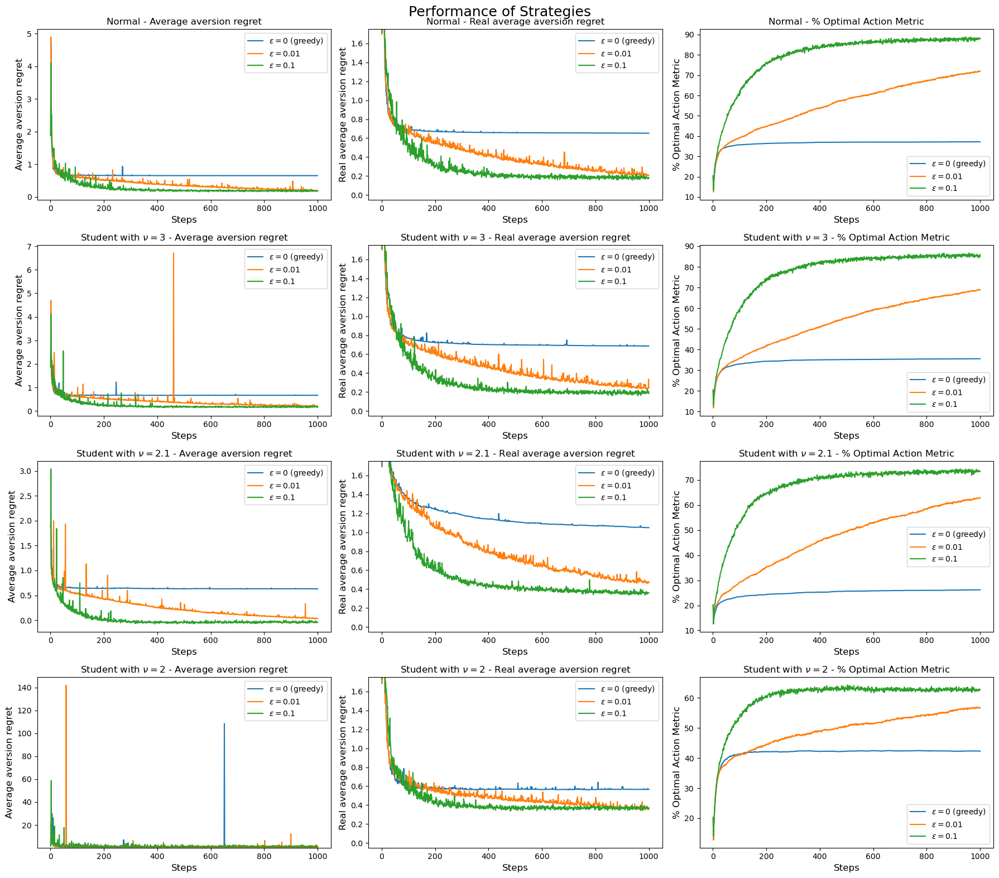

In [41]:
plot_strategies_results(all_metrics['eps_greedy_subjective_test'],
                        labels,
                        set_ylim)

In [42]:
def compare_subjective_aversions(distributions: list[type[InheritorsOfDistr]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategy: type[AversionStrategy],
                       strategy_params: dict,
                       aversions: list | np.ndarray):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for aversion in aversions:
            print(f"aversion: {aversion}")
            bandit_tester = SubjectiveAversionBanditTester(distribution, strategy, distribution_params, strategy_params, aversion=aversion)
            metrics = bandit_tester.test()
    
            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics


In [43]:
aversion_metrics = compare_subjective_aversions(distributions, distributions_params, distributions_names, EpsilonGreedy, {'epsilon': 0.1}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [06:38<00:00,  5.02it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:31<00:00,  5.11it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:36<00:00,  5.05it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:33<00:00,  5.08it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:32<00:00,  5.10it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:44<00:00,  4.95it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:42<00:00,  4.96it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:32<00:00,  5.09it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [06:14<00:00,  5.34it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:38<00:00,  5.01it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:41<00:00,  4.98it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:43<00:00,  4.96it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:42<00:00,  4.97it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:21<00:00,  5.24it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:14<00:00,  5.34it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:15<00:00,  5.33it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:15<00:00,  5.33it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:06<00:00,  5.46it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:08<00:00,  5.43it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:29<00:00,  5.13it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:45<00:00,  4.93it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:49<00:00,  4.89it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:44<00:00,  4.94it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:43<00:00,  4.96it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:44<00:00,  4.94it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:52<00:00,  4.85it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [06:38<00:00,  5.02it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:46<00:00,  4.92it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:42<00:00,  4.97it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:44<00:00,  4.94it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:47<00:00,  4.91it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:32<00:00,  5.10it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:30<00:00,  5.12it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:52<00:00,  4.85it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:54<00:00,  4.83it/s]


In [44]:
save_new_metrics(aversion_metrics, 'eps_greedy_subjective_aversions_test')

In [45]:
all_metrics = load_all_metrics()

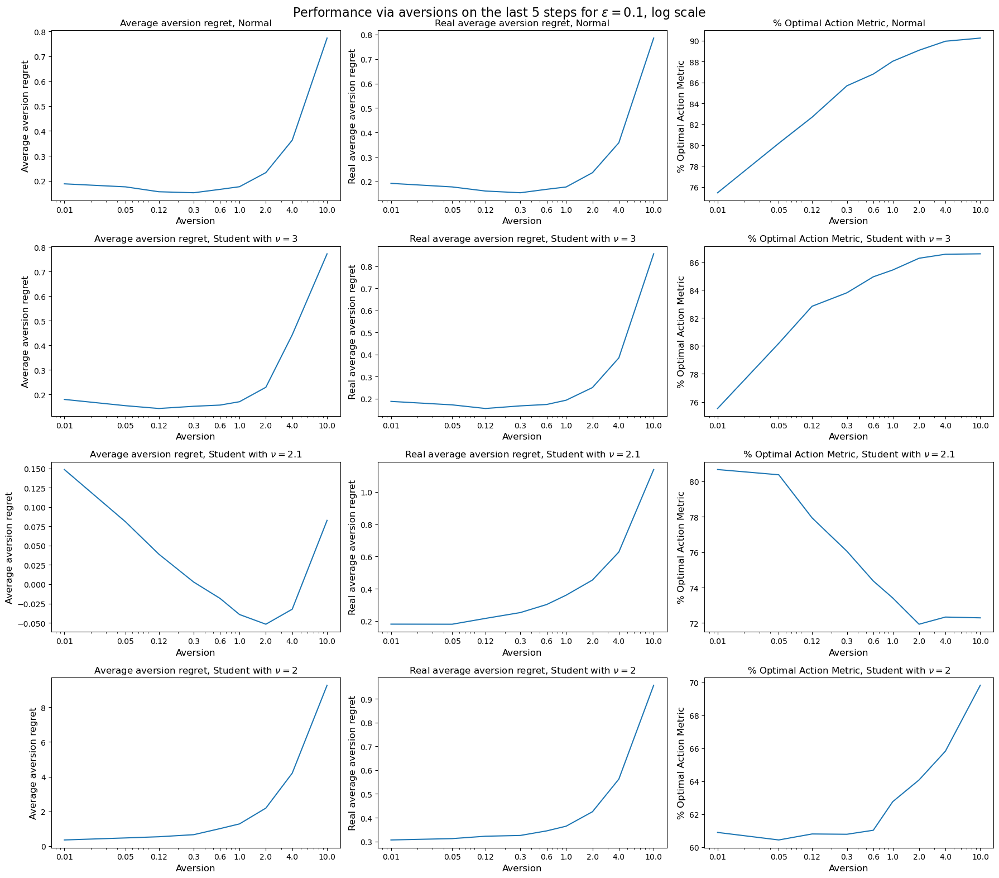

In [46]:
plot_last_results_depending_on_aversion(all_metrics['eps_greedy_subjective_aversions_test'], aversions, r"$\epsilon = 0.1$")

## Check why the dependency of metrics from aversion is so strange

In [118]:
aversion = 1
num_arms = 10

distribution = Student(num_distrib=num_arms, mu=2.1)
strategy = GradientBandit(num_arms=num_arms, baseline=True, alpha=0.1)
optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, aversion)

for i in range(1000):
    arm, probs = strategy.choose_arm()
    reward = distribution.pull_the_lever(arm)
    strategy.update(arm, reward)

print(distribution.locations)
print(distribution.scales ** 2)
print(optimal_probs)
print(strategy.probs)
print("q", strategy.q_values)
print("s", strategy.s_values)
print("avers", strategy.aversion)
print(strategy.counts)
print(1 - np.sum(np.abs(strategy.probs - optimal_probs)) / 2)

[ 0.95882414  0.66637686  2.22871657  1.03991631  0.9086141   1.79749269
 -0.02956251 -0.26311233 -0.6249055   1.56801246]
[0.         0.4223517  0.         0.42704541 0.2349464  1.19554328
 0.6643142  9.57473318 7.58333647 0.78864824]
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
[1.44927677e-04 1.51420712e-04 2.56125378e-04 1.62797690e-04
 1.45057462e-04 9.98630724e-01 9.49907385e-05 1.34722745e-04
 5.58640642e-05 2.23369273e-04]
q [ 0.95882414  0.9024432   2.22871657  1.08061979  0.86829507  1.78811987
 -0.0099131   0.0702424   4.87832157  1.46327533]
s [0.00000000e+00 1.99489254e-01 0.00000000e+00 2.67333074e-02
 7.08511453e-02 3.50431080e-01 4.28455088e-02 4.77092124e-01
 8.82550721e+01 7.69934257e-02]
avers 1.0
[ 11.   8.   8.   8.   8. 928.   7.   4.   4.  14.]
0.000256125378123917


In [60]:
bandit_tester = AversionBanditTester(Student, EpsilonGreedy, {'mu': 2.1}, {'epsilon': 0.1,  'aversion': 0.00001},  num_arms=num_arms, test_num=1000)
metrics = bandit_tester.test()

100%|██████████| 1000/1000 [03:18<00:00,  5.03it/s]


In [61]:
print(metrics['optimal_actions'][-5:])

[0.8101 0.8067 0.8129 0.8206 0.7968]


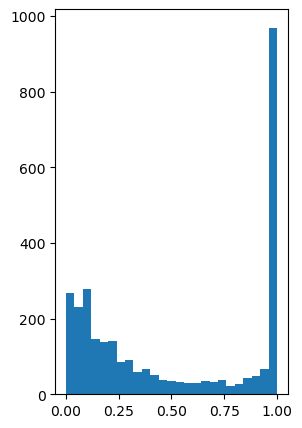

In [261]:
plt.figure(figsize=(3, 5))
plt.hist(metrics['last_optimal_actions_probs'], bins=25)
plt.show()

In [234]:
print(metrics['optimal_actions'][-5:])

[0.54578699 0.5396464  0.52146097 0.52583114 0.51732218]


In [100]:
class SimpleEpsilonGreedy(Strategy):
    def __init__(self, num_arms, epsilon=0.1, step_size=lambda count: 1 / count):
        super().__init__(num_arms, step_size=step_size)
        self.epsilon = epsilon

    def choose_arm(self) -> tuple[int, np.ndarray]:
        if np.random.random() < self.epsilon:
            # Explore: choose random arm
            arm = np.random.randint(0, self.num_arms)
            probs = np.zeros(self.num_arms)
            probs[arm] = 1
        else:
            # Exploit: choose arm with highest estimated reward
            arm = int(np.argmax(self.q_values))
            probs = np.ones(self.num_arms) / self.num_arms
        return arm, probs

    def update(self, arm, reward):
        self.counts[arm] += 1
        self.q_values[arm] = self.q_values[arm] + self.step_size(self.counts[arm]) * (reward - self.q_values[arm])

In [143]:
delta = 0.

In [312]:
aversion = 0.0001
num_arms = 2
distribution = Gaussian(num_distrib=num_arms)
strategy1 = EpsilonGreedy(num_arms=num_arms, epsilon=0.1, aversion=aversion)
strategy2 = SimpleEpsilonGreedy(num_arms=num_arms, epsilon=0.1)
optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, aversion)
opt_greedy_probs = np.zeros(num_arms)
opt_greedy_probs[np.argmax(distribution.locations)] = 1.


for i in range(1000):
    arm, probs = strategy1.choose_arm()
    reward = distribution.pull_the_lever(arm)
    strategy1.update(arm, reward)

    arm, probs = strategy2.choose_arm()
    reward = distribution.pull_the_lever(arm)
    strategy2.update(arm, reward)

print(distribution.locations)
print(distribution.scales ** 2)
print()

print(strategy1.q_values)
print(strategy2.q_values)
print()

print(optimal_probs)
print(strategy1.probs)
print()
print(opt_greedy_probs)
probs2 = np.zeros(num_arms)
probs2[np.argmax(strategy2.q_values)] = 1.
print(probs2)

print(1 - np.sum(np.abs(optimal_probs - strategy1.probs)) / 2)
print(int(np.argmax(strategy2.q_values) == np.argmax(distribution.locations)))
delta += (1 - np.sum(np.abs(optimal_probs - strategy1.probs)) / 2) - int(np.argmax(strategy2.q_values) == np.argmax(distribution.locations))

[1.68094361 1.6560732 ]
[7.57618103 1.076187  ]

[1.66921166 1.69082515]
[1.89839166 1.7810416 ]

[1. 0.]
[0. 1.]

[1. 0.]
[1. 0.]
0.0
1


In [320]:
bandit_tester = AversionBanditTester(Gaussian, EpsilonGreedy, {}, {'epsilon': 0.1,  'aversion': 0.00001},  num_arms=2, test_num=200)
metrics_2 = bandit_tester.test()

100%|██████████| 200/200 [00:36<00:00,  5.47it/s]


In [321]:
bandit_tester = BanditTester(Gaussian, SimpleEpsilonGreedy, {}, {'epsilon': 0.1},  num_arms=2, test_num=200)
simple_metrics_2 = bandit_tester.test()

100%|██████████| 200/200 [00:13<00:00, 15.34it/s]


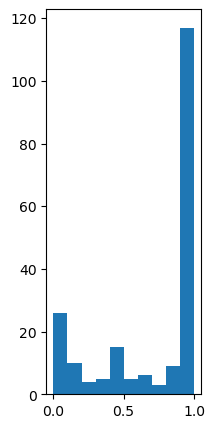

In [263]:
plt.figure(figsize=(2,5))
plt.hist(metrics_2['last_optimal_actions_probs'], bins=10)
plt.show()

In [322]:
print(np.mean(metrics_2['last_optimal_actions_probs']))
print(np.mean(simple_metrics_2['optimal_actions'][-1]))

0.6333237287111152
0.8700000000000007


In [65]:
num_arms=10
aversion=0.01
bandit_tester = AversionBanditTester(Student, EpsilonGreedy, {'mu': 2.1}, {'epsilon': 0.1,  'aversion': aversion},  num_arms=num_arms, test_num=1000)
metrics1 = bandit_tester.test()
bandit_tester = AversionBanditTester(Gaussian, EpsilonGreedy, {}, {'epsilon': 0.1,  'aversion': aversion},  num_arms=num_arms, test_num=1000)
metrics2 = bandit_tester.test()

100%|██████████| 1000/1000 [03:20<00:00,  4.98it/s]


In [66]:
print(metrics1['average_sorted_counts'])
print(metrics2['average_sorted_counts'])

[  5.968   7.643   8.954  10.093  11.404  13.154  17.078  31.951  93.765
 799.99 ]
[  6.16    7.871   9.172  10.385  11.868  13.95   18.291  32.964 107.236
 782.103]


### Check why increasing $\lambda$ decreases metrics

In [455]:
aversion = 4
opt_act = 0.
num_arms = 10
test_num = 200
np.random.seed(42) 
opt_act_all = 0.
for k in tqdm(range(test_num)):
    distribution = Gaussian(num_distrib=num_arms)
    strategy = EpsilonGreedy(num_arms=num_arms, epsilon=0.1, aversion=aversion)
    optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, aversion)

    for i in range(1000):
        arm, probs = strategy.choose_arm()
        reward = distribution.pull_the_lever(arm)
        strategy.update(arm, reward)

        if i == 999:
            opt_act_all += 1 - np.sum(np.abs(optimal_probs - probs)) / 2


    opt_act += 1 - np.sum(np.abs(strategy.probs - optimal_probs)) / 2

print(opt_act / test_num)
print(opt_act_all / test_num)
'''
print(distribution.locations)
print(distribution.scales ** 2)
print(optimal_probs)
print(strategy.probs)
print("q", strategy.q_values)
print("s", strategy.s_values)
print("avers", strategy.aversion)
print(strategy.counts)
print(1 - np.sum(np.abs(strategy.probs - optimal_probs)) / 2)'''

100%|██████████| 200/200 [00:31<00:00,  6.27it/s]

0.9725109468545292
0.88533045843057


'\nprint(distribution.locations)\nprint(distribution.scales ** 2)\nprint(optimal_probs)\nprint(strategy.probs)\nprint("q", strategy.q_values)\nprint("s", strategy.s_values)\nprint("avers", strategy.aversion)\nprint(strategy.counts)\nprint(1 - np.sum(np.abs(strategy.probs - optimal_probs)) / 2)'

In [59]:
bandit_tester = AversionBanditTester(Student, EpsilonGreedy, {'mu': 2.1}, {'epsilon': 0.1,  'aversion': aversion},  num_arms=num_arms, test_num=200)
metrics = bandit_tester.test()

 79%|███████▉  | 158/200 [00:32<00:08,  4.83it/s]


KeyboardInterrupt: 

In [ ]:
print(metrics['optimal_actions'][-5:])

[0.89732856 0.9167869  0.88086716 0.88375162 0.88533046]


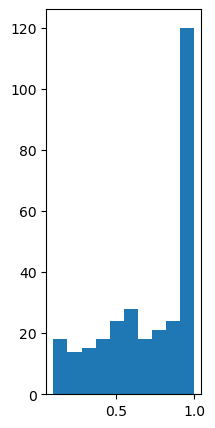

In [405]:
plt.figure(figsize=(2,5))
plt.hist(metrics['last_optimal_actions_probs'], bins=10)
plt.show()

In [504]:
class SimplifiedAversionBanditTester():
    def __init__(self,
                 distribution: Type[Distribution],
                 strategy: Type[AversionStrategy],
                 distribution_params,
                 strategy_params,
                 num_arms=10,
                 test_num=2000,
                 test_len=1000):
        np.random.seed(42)
        self.distribution = distribution
        self.strategy = strategy
        self.distribution_params = distribution_params
        self.distribution_params["num_distrib"] = num_arms
        self.strategy_params = strategy_params
        self.strategy_params["num_arms"] = num_arms
        self.test_num = test_num
        self.test_len = test_len

        self.metric_results = {}
        self.metric_results['optimal_actions'] = np.zeros(self.test_len)
        self.aversion = strategy_params['aversion']

    def _get_opt_actions_metric(self, pred_probs, optimal_probs):
        return 1 - np.sum(np.abs(pred_probs - optimal_probs)) / 2
    
    def test(self) -> dict[str, np.ndarray]:
        for _ in tqdm(range(self.test_num)):
            strategy = self.strategy(**self.strategy_params)  # Create a new strategy instance for each run
            distribution = self.distribution(**self.distribution_params)  # Create a new distribution instance for each run

            optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, self.aversion)

            for i in range(self.test_len):
                arm, probs = strategy.choose_arm()
                reward = distribution.pull_the_lever(arm)
                strategy.update(arm, reward)

                self.metric_results['optimal_actions'][i] += self._get_opt_actions_metric(probs, optimal_probs) / self.test_num

        return self.metric_results
        

In [505]:
bandit_tester = AversionBanditTester(Gaussian, EpsilonGreedy, {}, {'epsilon': 0.1,  'aversion': 10},  num_arms=num_arms, test_num=200)
metrics = bandit_tester.test()
print(metrics['optimal_actions'][-5:])

100%|██████████| 200/200 [00:40<00:00,  4.89it/s]

[0.86419149 0.93851456 0.93133798 0.89072847 0.90600411]


## Correction of variance in $\epsilon$-greedy

In [47]:
def get_normalizing_constant_for_sample_variance(sampler, test_len=1000, test_num=500000, is_mode=False):
    sample_variances = []
    for _ in tqdm(range(test_num)):
        samples = sampler.rvs(size=test_len)
        sample_variances.append(np.var(samples, ddof=1))
    
    if not is_mode:
        return 1 / np.median(sample_variances)
    else:
        sample_variances = np.round(sample_variances, 3)
        vars_counts = Counter(sample_variances)
        print(vars_counts.most_common(3))
        return 1 / vars_counts.most_common(1)[0][0]

In [48]:
df = 2.1
norm_const_for_median = get_normalizing_constant_for_sample_variance(student_t(df=df, loc=0, scale=np.sqrt((df - 2) / df)))
norm_const_for_mode = get_normalizing_constant_for_sample_variance(student_t(df=df, loc=0, scale=np.sqrt((df - 2) / df)), is_mode=True)

print(norm_const_for_median, norm_const_for_mode)

100%|██████████| 500000/500000 [01:35<00:00, 5221.96it/s]


[(0.248, 2557), (0.239, 2541), (0.238, 2528)]
3.372685807610237 4.032258064516129


In [23]:
class CorrectionEpsilonGreedy(EpsilonGreedy):
    def __init__(self, num_arms, correct_const, epsilon=0.1, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion, epsilon=epsilon)
        self.correct_const = correct_const

    def update(self, arm, reward):
        self._update_counts_and_q_values(arm, reward)
        self.s_values[arm] = 0 if self.counts[arm] <= 1 else self.correct_const * (self.counts[arm] / (self.counts[arm] - 1)) *\
            (self.q_square_values[arm] - self.q_values[arm] ** 2)

        self.probs = get_optimal_probs(self.q_values, self.s_values, self.aversion)
        self.probs /= np.sum(self.probs) # Normalization for numpy.random.choice correct work


In [50]:
correction_distributions = [Student]
correction_distributions_params = [{'mu': 2.1}]
correction_distributions_names = ["Student with "+r"$\nu=2.1$"]
correction_strategies = [EpsilonGreedy, CorrectionEpsilonGreedy, CorrectionEpsilonGreedy]
correction_strategies_params = [{'epsilon': 0.1}, {'epsilon': 0.1, 'correct_const': norm_const_for_median}, {'epsilon': 0.1, 'correct_const': norm_const_for_mode}]

In [51]:
metrics = compare_subjective_strategies(correction_distributions, correction_distributions_params, correction_distributions_names,
                             correction_strategies, correction_strategies_params)


Student with $\nu=2.1$


100%|██████████| 2000/2000 [06:53<00:00,  4.84it/s]


In [52]:
save_new_metrics(metrics, 'correct_eps_greedy_subjective_test')

In [29]:
labels = [r"$\epsilon = 0.1$", r'$\epsilon=0.1$ with median correction', r'$\epsilon=0.1$ with mode correction']

def set_ylim(key: str, i: int, axes_flat) -> None:
    axes_flat[3 * i].set_ylim(-0.3, 0.8)
    axes_flat[3 * i + 1].set_ylim(0, 1)
    axes_flat[3 * i + 2].set_ylim(50, None)

In [25]:
all_metrics = load_all_metrics()

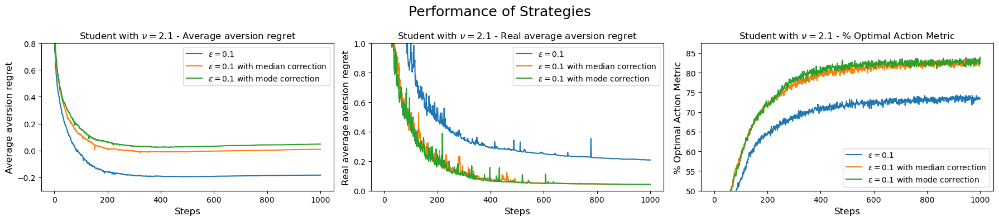

In [30]:
plot_strategies_results(all_metrics['correct_eps_greedy_test'], labels, set_ylim)

In [55]:
aversion_metrics = compare_subjective_aversions(correction_distributions,
                                     correction_distributions_params,
                                     correction_distributions_names,
                                     CorrectionEpsilonGreedy,
                                     {'epsilon': 0.1, 'correct_const': norm_const_for_mode},
                                     aversions)

Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:36<00:00,  5.04it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:41<00:00,  4.98it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:55<00:00,  4.81it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:54<00:00,  4.83it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:40<00:00,  5.00it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:16<00:00,  5.31it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:43<00:00,  4.95it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:55<00:00,  4.82it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:51<00:00,  4.86it/s]


In [56]:
save_new_metrics(aversion_metrics, 'correct_eps_greedy_subjective_aversions_test')

In [57]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

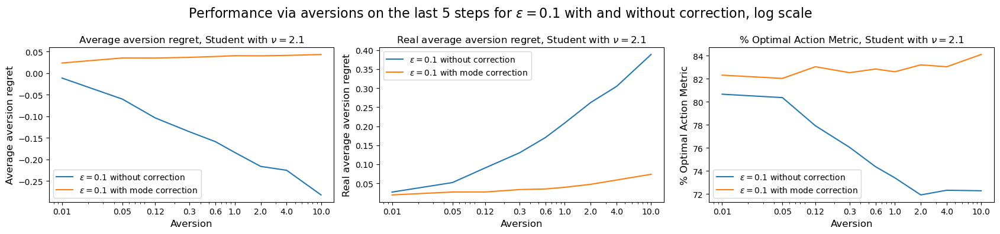

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(17, 4))

axes_flat = axes.flatten()

fig.suptitle(rf"Performance via aversions on the last 5 steps for $\epsilon=0.1$ with and without correction, log scale", fontsize=16)
for ax in axes_flat:
    ax.set_xlabel("Aversion", size=12)


strategies_names = [r'$\epsilon=0.1$ without correction', r'$\epsilon=0.1$ with mode correction']
folder_names = ['eps_greedy_aversions_test', 'correct_eps_greedy_aversions_test']
distr_name = "Student with "+r"$\nu=2.1$"
for k, metric_name in enumerate(metrics_names):
    for folder_name, strategy_name in zip(folder_names, strategies_names):
        values = []
        for data in all_metrics[folder_name][distr_name][metric_name]:
            values.append(np.mean(np.array(data[-5:])))
        axes_flat[k].plot(aversions, values if metric_name != 'optimal_actions' else [100 * x for x in values], label=strategy_name)

    axes_flat[k].legend()
    for k, metric_title in enumerate(metrics_titles):
        axes_flat[k].set_title(f"{metric_title}, {distr_name}", size=12)
        axes_flat[k].set_ylabel(metric_title, size=12)
        axes_flat[k].set_xscale('log')
        axes_flat[k].set_xticks(aversions, [str(aversion) for aversion in aversions])

plt.tight_layout()
plt.show()

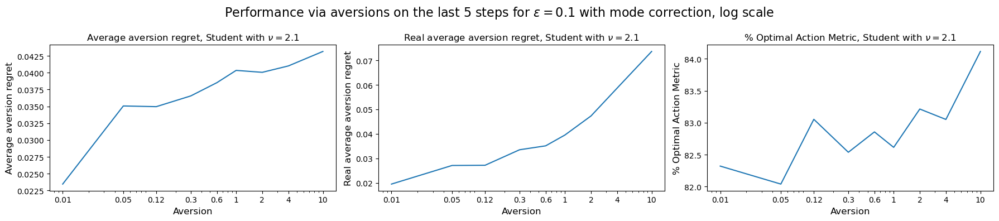

In [571]:
plot_last_results_depending_on_aversion(all_metrics['correct_eps_greedy_aversions_test'], aversions, r'$\epsilon=0.1$ with mode correction')

## Adaptive $\epsilon$-greedy strategies

### Classic version

In [59]:
class DecreasingEpsilonGreedy(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=1, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.t = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.t += 1
        if np.random.random() < self.epsilon / self.t:
            # Explore: choose random arm
            return np.random.randint(0, self.num_arms), np.ones(self.num_arms) / self.num_arms
        else:
            return np.random.choice(np.arange(self.num_arms), p=self.probs), self.probs
        

class VDBEEpsilonGreedy(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=1, step_size=lambda count: 1 / count, aversion=1., temperature=1., eps_step_size=0.1):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.temp = temperature
        self.eps_step_size = eps_step_size
    
    def update(self, arm, reward):
        old_w = self.q_values[arm] - 2 * self.aversion * self.probs[arm] * self.s_values[arm]
        super().update(arm, reward)
        new_w = self.q_values[arm] - 2 * self.aversion * self.probs[arm] * self.s_values[arm]
        old_w -= np.maximum(old_w, new_w)
        new_w -= np.maximum(old_w, new_w)
        exp_old_w = np.exp(old_w / self.temp)
        exp_new_w = np.exp(new_w / self.temp)
        try:
            current_eps = np.abs((exp_old_w - exp_new_w) / (exp_old_w + exp_new_w))
        except RuntimeWarning:
            print(old_w, new_w, exp_old_w, exp_new_w)
        self.epsilon = self.eps_step_size * current_eps + (1 - self.eps_step_size) * self.epsilon
    

In [60]:
strategies = [EpsilonGreedy, DecreasingEpsilonGreedy, DecreasingEpsilonGreedy, VDBEEpsilonGreedy, VDBEEpsilonGreedy]
strategies_params = [{'epsilon': 0.1},
                     {'epsilon': 1},
                     {'epsilon': 10},
                     {'epsilon': 1, 'temperature': 1., 'eps_step_size': 0.1},
                     {'epsilon': 10, 'temperature': 1., 'eps_step_size': 0.1}]

In [144]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [145]:
save_new_metrics(metrics, 'adaptive_eps_test')

In [170]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0 or i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.5)
        axes_flat[3 * i + 1].set_ylim(0.15, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.15, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)

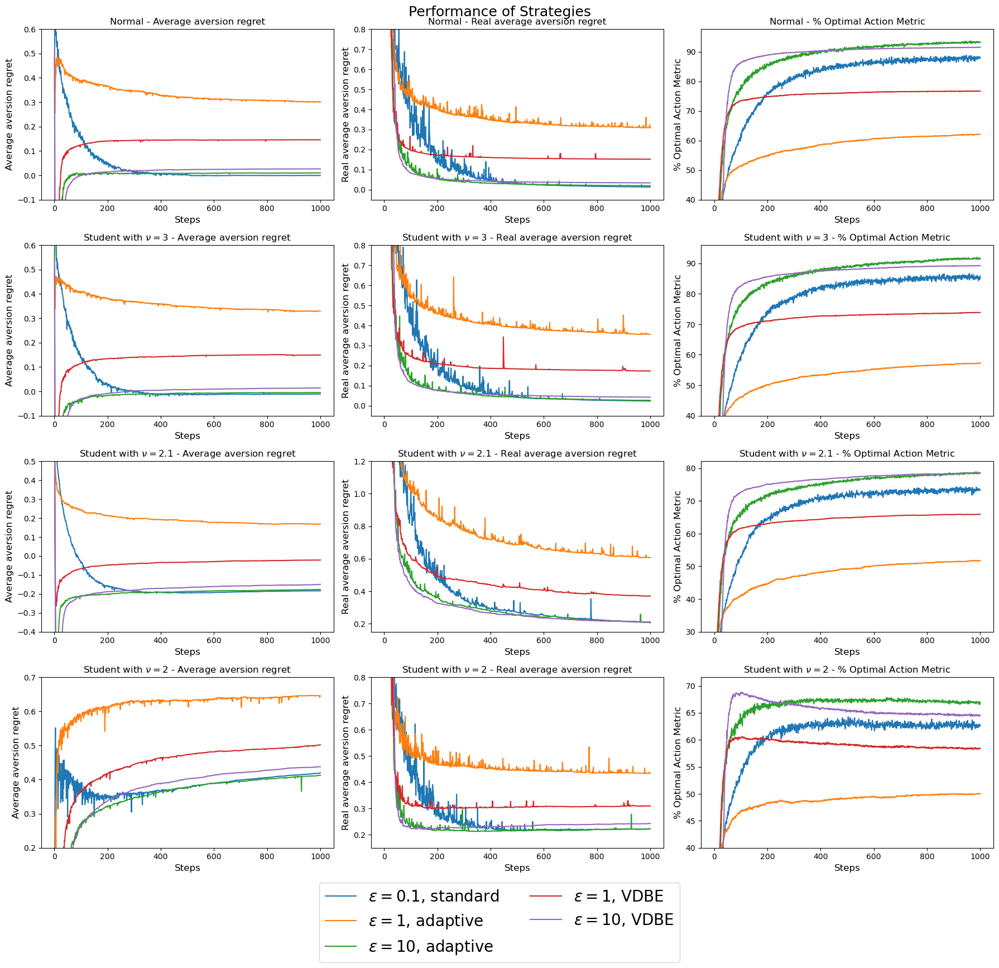

In [176]:
labels = [r"$\epsilon = 0.1$, standard",
          r"$\epsilon = 1$, adaptive",
          r"$\epsilon = 10$, adaptive",
          r"$\epsilon = 1$, VDBE",
          r"$\epsilon = 10$, VDBE"]

plot_strategies_results(all_metrics['adaptive_eps_test'], labels, set_ylim, set_legend_outside=True)

In [183]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(40, None)
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.7)
    elif i == 1:
        axes_flat[3 * i].set_ylim(0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.25, 1.25)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.6, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.6)
        axes_flat[3 * i + 1].set_ylim(0.1, 0.7)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)

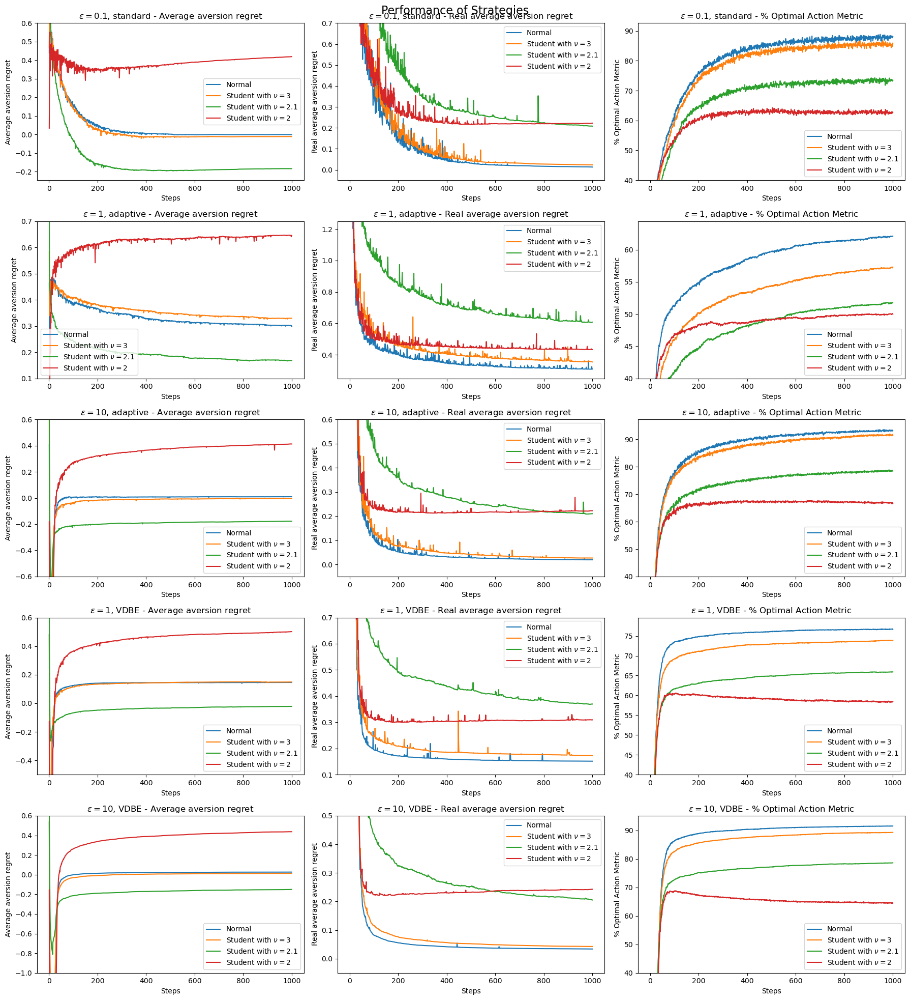

In [184]:
plot_distributions_results(all_metrics['adaptive_eps_test'], labels, set_label_ylim)

In [576]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, DecreasingEpsilonGreedy, {'epsilon': 10}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [05:41<00:00,  5.85it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:41<00:00,  5.86it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:44<00:00,  5.81it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:46<00:00,  5.77it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:47<00:00,  5.76it/s]


aversion: 1


100%|██████████| 2000/2000 [05:48<00:00,  5.74it/s]


aversion: 2


100%|██████████| 2000/2000 [05:49<00:00,  5.73it/s]


aversion: 4


100%|██████████| 2000/2000 [05:48<00:00,  5.74it/s]


aversion: 10


100%|██████████| 2000/2000 [05:52<00:00,  5.67it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [05:55<00:00,  5.63it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:57<00:00,  5.60it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:57<00:00,  5.60it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:59<00:00,  5.56it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:04<00:00,  5.49it/s]


aversion: 1


100%|██████████| 2000/2000 [05:59<00:00,  5.56it/s]


aversion: 2


100%|██████████| 2000/2000 [06:05<00:00,  5.47it/s]


aversion: 4


100%|██████████| 2000/2000 [06:05<00:00,  5.47it/s]


aversion: 10


100%|██████████| 2000/2000 [06:07<00:00,  5.44it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [05:55<00:00,  5.62it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:55<00:00,  5.63it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:54<00:00,  5.65it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:59<00:00,  5.56it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:00<00:00,  5.54it/s]


aversion: 1


100%|██████████| 2000/2000 [05:58<00:00,  5.58it/s]


aversion: 2


100%|██████████| 2000/2000 [06:00<00:00,  5.54it/s]


aversion: 4


100%|██████████| 2000/2000 [06:01<00:00,  5.53it/s]


aversion: 10


100%|██████████| 2000/2000 [06:02<00:00,  5.52it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [05:56<00:00,  5.61it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:58<00:00,  5.58it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:56<00:00,  5.61it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:58<00:00,  5.58it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:02<00:00,  5.51it/s]


aversion: 1


100%|██████████| 2000/2000 [06:04<00:00,  5.49it/s]


aversion: 2


100%|██████████| 2000/2000 [06:03<00:00,  5.50it/s]


aversion: 4


100%|██████████| 2000/2000 [06:04<00:00,  5.49it/s]


aversion: 10


100%|██████████| 2000/2000 [06:05<00:00,  5.47it/s]


In [577]:
save_new_metrics(aversion_metrics, 'adaptive_eps_aversions_test')

In [92]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, VDBEEpsilonGreedy, {'epsilon': 10, 'temperature': 1., 'eps_step_size': 0.1}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [06:42<00:00,  4.97it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:38<00:00,  5.02it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:28<00:00,  5.14it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:48<00:00,  4.89it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:04<00:00,  4.71it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:44<00:00,  4.95it/s]


aversion: 2.0


100%|██████████| 2000/2000 [07:08<00:00,  4.66it/s]


aversion: 4.0


100%|██████████| 2000/2000 [07:32<00:00,  4.42it/s]


aversion: 10.0


100%|██████████| 2000/2000 [07:40<00:00,  4.34it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [07:02<00:00,  4.73it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:22<00:00,  4.52it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:50<00:00,  4.87it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:45<00:00,  4.93it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:44<00:00,  4.94it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:44<00:00,  4.94it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:44<00:00,  4.95it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:47<00:00,  4.91it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:59<00:00,  4.77it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:57<00:00,  4.79it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:07<00:00,  4.68it/s]


aversion: 0.12


100%|██████████| 2000/2000 [07:05<00:00,  4.70it/s]


aversion: 0.3


100%|██████████| 2000/2000 [07:29<00:00,  4.45it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:23<00:00,  4.51it/s]


aversion: 1.0


100%|██████████| 2000/2000 [07:05<00:00,  4.70it/s]


aversion: 2.0


100%|██████████| 2000/2000 [07:01<00:00,  4.75it/s]


aversion: 4.0


100%|██████████| 2000/2000 [07:19<00:00,  4.55it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:57<00:00,  4.78it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [07:20<00:00,  4.54it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:03<00:00,  4.72it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:46<00:00,  4.93it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:48<00:00,  4.89it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:40<00:00,  5.00it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:41<00:00,  4.99it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:52<00:00,  4.85it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:38<00:00,  5.02it/s]


In [93]:
save_new_metrics(aversion_metrics, 'VDBE_aversions_test')

In [94]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

In [204]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.25, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.35)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.5, 0.4)
        axes_flat[3 * i + 1].set_ylim(0, 0.2)
        axes_flat[3 * i + 2].set_ylim(60, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.5, 0.3)
        axes_flat[3 * i + 1].set_ylim(0, 0.25)
        axes_flat[3 * i + 2].set_ylim(60, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.25)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-0.6, 0.05)
        axes_flat[3 * i + 1].set_ylim(-0.1, 1.75)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 5:
        axes_flat[3 * i].set_ylim(-1, 0)
        axes_flat[3 * i + 1].set_ylim(-0.1, 3.5)
        axes_flat[3 * i + 2].set_ylim(35, None)

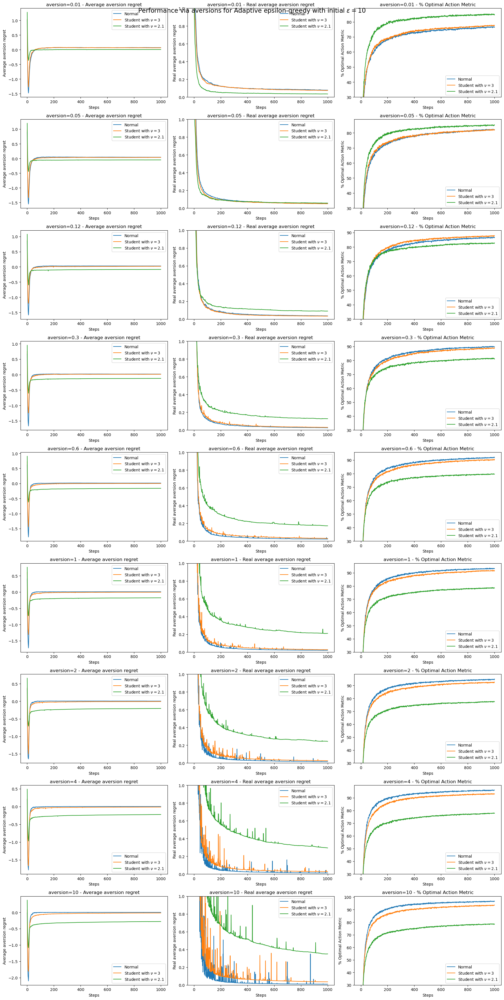

In [580]:
plot_results_via_aversions(all_metrics['adaptive_eps_aversions_test'], aversions, r"Adaptive epsilon-greedy with initial $\epsilon = 10$", set_ylim)

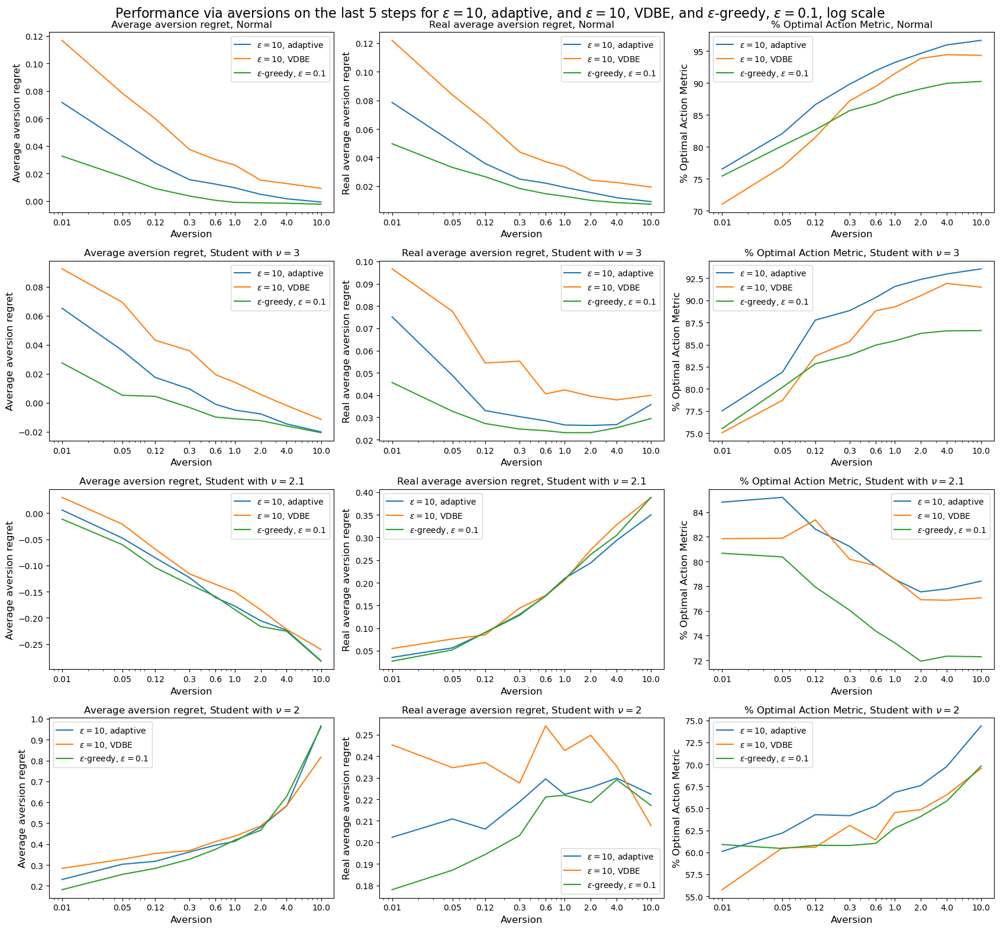

In [32]:
strategies_names = [r"$\epsilon = 10$, adaptive", r"$\epsilon = 10$, VDBE", r"$\epsilon$-greedy, $\epsilon=0.1$"]
folders_names = ['adaptive_eps_aversions_test', 'VDBE_aversions_test', 'eps_greedy_aversions_test']
plot_aversion_comparison_between_strategies(strategies_names=strategies_names, folders_names=folders_names, aversions=aversions)

### Subjective version

In [62]:
metrics = compare_subjective_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal


100%|██████████| 2000/2000 [06:57<00:00,  4.79it/s]


Student with $\nu=3$


100%|██████████| 2000/2000 [06:54<00:00,  4.82it/s]


Student with $\nu=2.1$


100%|██████████| 2000/2000 [07:06<00:00,  4.69it/s]


Student with $\nu=2$


100%|██████████| 2000/2000 [06:32<00:00,  5.09it/s]


In [63]:
save_new_metrics(metrics, 'adaptive_eps_subjective_test')

In [64]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0 or i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.5)
        axes_flat[3 * i + 1].set_ylim(0.15, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.15, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)

In [65]:
all_metrics = load_all_metrics()

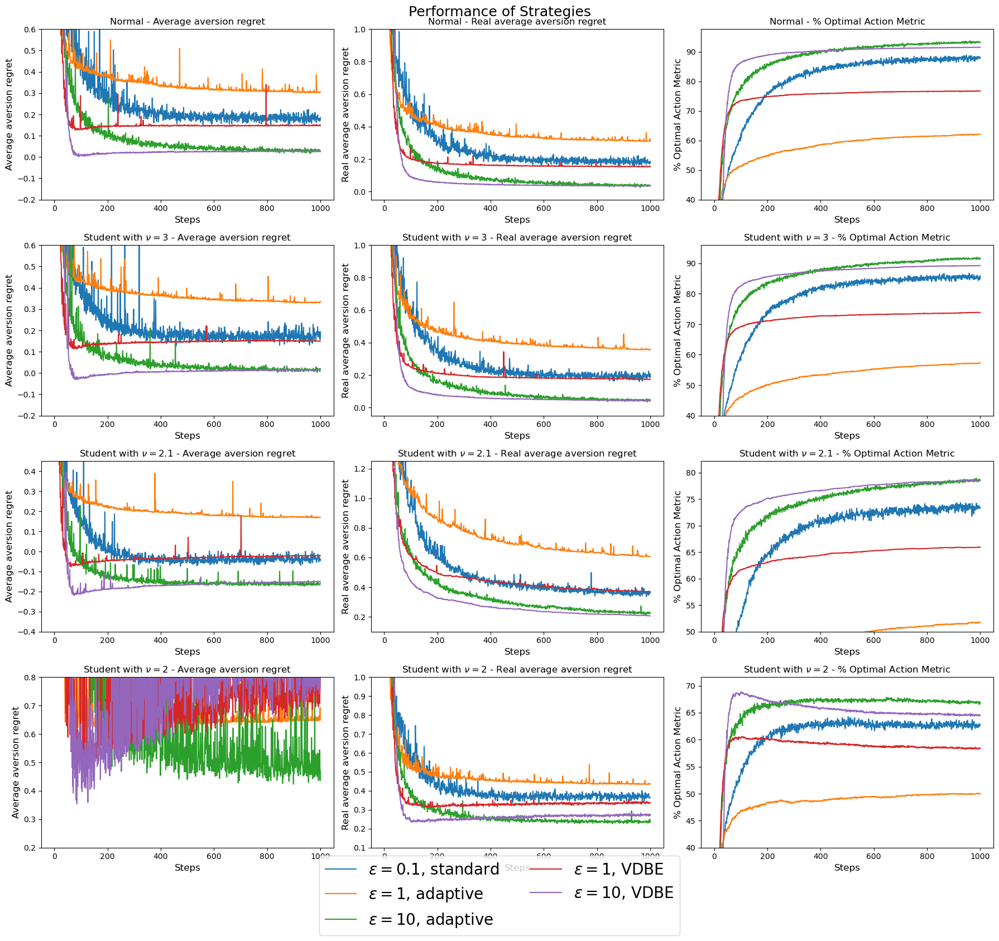

In [89]:
labels = [r"$\epsilon = 0.1$, standard",
          r"$\epsilon = 1$, adaptive",
          r"$\epsilon = 10$, adaptive",
          r"$\epsilon = 1$, VDBE",
          r"$\epsilon = 10$, VDBE"]

plot_strategies_results(all_metrics['adaptive_eps_subjective_test'], labels, set_ylim, set_legend_outside=True)

In [91]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(40, None)
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.7)
    elif i == 1:
        axes_flat[3 * i].set_ylim(0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.25, 1.25)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.6, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.6)
        axes_flat[3 * i + 1].set_ylim(0.1, 0.7)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)

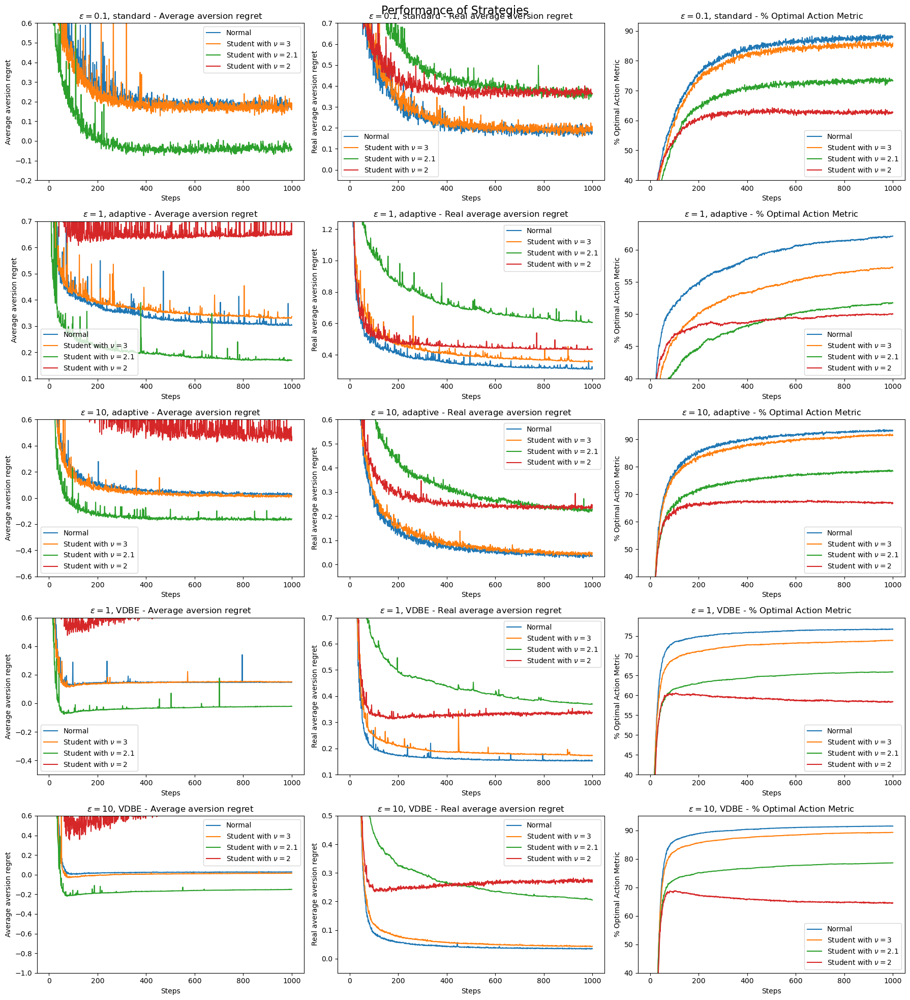

In [92]:
plot_distributions_results(all_metrics['adaptive_eps_subjective_test'], labels, set_label_ylim)

In [68]:
aversion_metrics = compare_subjective_aversions(distributions, distributions_params, distributions_names, DecreasingEpsilonGreedy, {'epsilon': 10}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [05:41<00:00,  5.86it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:06<00:00,  5.46it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:59<00:00,  5.56it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:02<00:00,  5.51it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:00<00:00,  5.55it/s]


aversion: 1.0


100%|██████████| 2000/2000 [05:54<00:00,  5.64it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:00<00:00,  5.55it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:04<00:00,  5.49it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:05<00:00,  5.48it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [06:27<00:00,  5.16it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:10<00:00,  5.40it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:21<00:00,  5.25it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:18<00:00,  5.28it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:15<00:00,  5.32it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:24<00:00,  5.20it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:34<00:00,  5.06it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:18<00:00,  5.29it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:40<00:00,  4.99it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:40<00:00,  5.00it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:34<00:00,  5.07it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:40<00:00,  4.99it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:11<00:00,  5.39it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:56<00:00,  5.61it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:04<00:00,  5.49it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:46<00:00,  4.92it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:29<00:00,  5.13it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:30<00:00,  5.12it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [06:28<00:00,  5.15it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:35<00:00,  5.06it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:42<00:00,  4.97it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:52<00:00,  4.85it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:54<00:00,  4.82it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:56<00:00,  4.80it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:39<00:00,  5.01it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:18<00:00,  5.29it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


In [69]:
save_new_metrics(aversion_metrics, 'adaptive_eps_subjective_aversions_test')

In [93]:
aversion_metrics = compare_subjective_aversions(distributions, distributions_params, distributions_names, VDBEEpsilonGreedy, {'epsilon': 10, 'temperature': 1., 'eps_step_size': 0.1}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [06:49<00:00,  4.89it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:53<00:00,  4.84it/s]


aversion: 0.12


100%|██████████| 2000/2000 [07:03<00:00,  4.73it/s]


aversion: 0.3


100%|██████████| 2000/2000 [07:10<00:00,  4.64it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:10<00:00,  4.65it/s]


aversion: 1.0


100%|██████████| 2000/2000 [07:12<00:00,  4.63it/s]


aversion: 2.0


100%|██████████| 2000/2000 [07:00<00:00,  4.76it/s]


aversion: 4.0


100%|██████████| 2000/2000 [07:08<00:00,  4.66it/s]


aversion: 10.0


100%|██████████| 2000/2000 [24:49<00:00,  1.34it/s]    


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [11:16<00:00,  2.96it/s]


aversion: 0.05


100%|██████████| 2000/2000 [12:07<00:00,  2.75it/s]


aversion: 0.12


100%|██████████| 2000/2000 [11:24<00:00,  2.92it/s]


aversion: 0.3


100%|██████████| 2000/2000 [11:21<00:00,  2.93it/s]


aversion: 0.6


100%|██████████| 2000/2000 [10:18<00:00,  3.24it/s]


aversion: 1.0


100%|██████████| 2000/2000 [11:37<00:00,  2.87it/s]


aversion: 2.0


100%|██████████| 2000/2000 [09:49<00:00,  3.40it/s] 


aversion: 4.0


100%|██████████| 2000/2000 [07:26<00:00,  4.48it/s]


aversion: 10.0


100%|██████████| 2000/2000 [07:31<00:00,  4.43it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [07:15<00:00,  4.59it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:08<00:00,  4.67it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:58<00:00,  4.78it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:41<00:00,  4.98it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:06<00:00,  4.69it/s]


aversion: 1.0


100%|██████████| 2000/2000 [07:17<00:00,  4.57it/s]


aversion: 2.0


100%|██████████| 2000/2000 [07:18<00:00,  4.56it/s]


aversion: 4.0


100%|██████████| 2000/2000 [07:19<00:00,  4.55it/s]


aversion: 10.0


100%|██████████| 2000/2000 [07:20<00:00,  4.54it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [07:08<00:00,  4.66it/s]


aversion: 0.05


100%|██████████| 2000/2000 [07:29<00:00,  4.45it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:54<00:00,  4.82it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:35<00:00,  5.05it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:40<00:00,  4.99it/s]


aversion: 1.0


100%|██████████| 2000/2000 [06:42<00:00,  4.96it/s]


aversion: 2.0


100%|██████████| 2000/2000 [06:42<00:00,  4.97it/s]


aversion: 4.0


100%|██████████| 2000/2000 [06:43<00:00,  4.96it/s]


aversion: 10.0


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


In [94]:
save_new_metrics(aversion_metrics, 'VDBE_subjective_aversions_test')

In [95]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

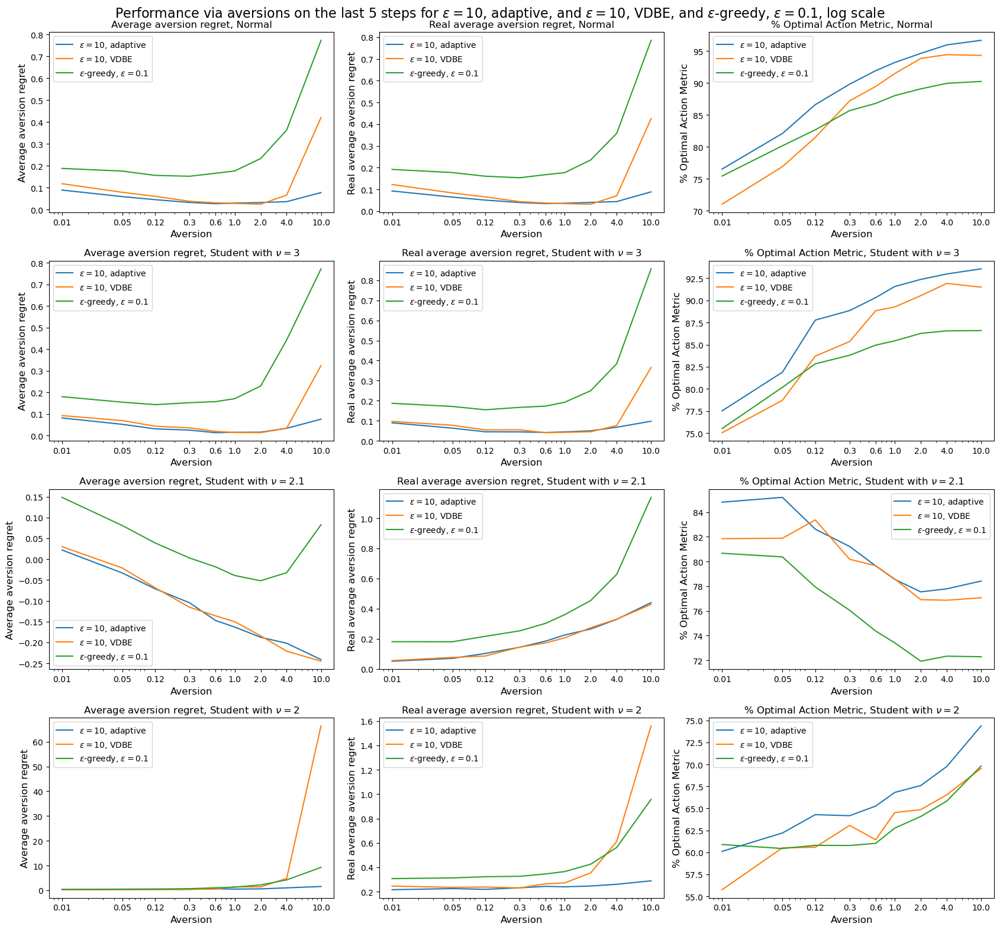

In [22]:
strategies_names = [r"$\epsilon = 10$, adaptive", r"$\epsilon = 10$, VDBE", r"$\epsilon$-greedy, $\epsilon=0.1$"]
folders_names = ['adaptive_eps_subjective_aversions_test', 'VDBE_subjective_aversions_test', 'eps_greedy_subjective_aversions_test']
plot_aversion_comparison_between_strategies(strategies_names=strategies_names, folders_names=folders_names, aversions=aversions)

## Positive initialization

In [97]:
class PositiveQ(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=0, step_size=0.1, pos_q=6, aversion=1.):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.q_values = np.ones(num_arms) * pos_q  # Initialize Q-values with positive values
        self.last_rewards = np.ones(num_arms) * -100_000_000
        self.s_values_middle = np.zeros(num_arms)
        self.weights_koef = np.ones(num_arms)

    def update(self, arm, reward):
        self.s_values_middle[arm] = (1 - self.step_size) * (
            self.s_values_middle[arm] + self.step_size * ((reward - self.q_values[arm]) ** 2))

        self.weights_koef[arm] *= (1 - self.step_size) ** 2
        scale = (2 - self.step_size) / (2 * (1 - self.step_size) * (1 - self.weights_koef[arm]))
        self.s_values[arm] = scale * self.s_values_middle[arm]

        self.q_values[arm] = self.q_values[arm] + (1 - self.step_size) * (reward - self.q_values[arm])
        self.counts[arm] += 1

        if self.last_rewards[arm] == reward: # asset is riskless
            self.s_values[arm] = 0
        self.last_rewards[arm] = reward
        self.probs = get_optimal_probs(self.q_values, self.s_values, self.aversion)
        # print("probs", self.probs)
        if np.all(self.probs == 0):
            print("probs", self.probs)
            print("q", self.q_values)
            print("s", self.s_values)
        self.probs /= np.sum(self.probs) # Normalization for numpy.random.choice correct work

In [98]:
strategies = [PositiveQ, PositiveQ, EpsilonGreedy]
strategies_params = [{'epsilon': 0}, {'epsilon': 0.1}, {'epsilon': 0.1}]

In [210]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [49]:
labels = ["Optimistic, greedy"+"\n"+r"$Q_1=8, \epsilon = 0$",
          r"Optimistic, $\epsilon$-greedy"+"\n"+r"$Q_1=8, \epsilon = 0.1$",
          r"Realistic, $\epsilon$-greedy"+"\n"+r"$Q_1=0, \epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    axes_flat[2 * i].set_ylim(1, 2.5)  # Set lowest y-axis value to 0.2

    # Special adjustments for the last row (Standard Cauchy)
    if key == "Cauchy":
        axes_flat[2 * i].set_ylim(-15, 10)  # Set x-axis limits for average reward
        axes_flat[2 * i + 1].set_ylim(None, 50)  # Set x-axis limits for optimal action

def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[2 * i].set_ylim(0.7, 2.5)

In [212]:
save_new_metrics(metrics, 'positive_init_test')

In [220]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.4)
        axes_flat[3 * i + 2].set_ylim(45, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.5)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.45)
        axes_flat[3 * i + 1].set_ylim(0, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 1.2)
        axes_flat[3 * i + 1].set_ylim(0.1, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)

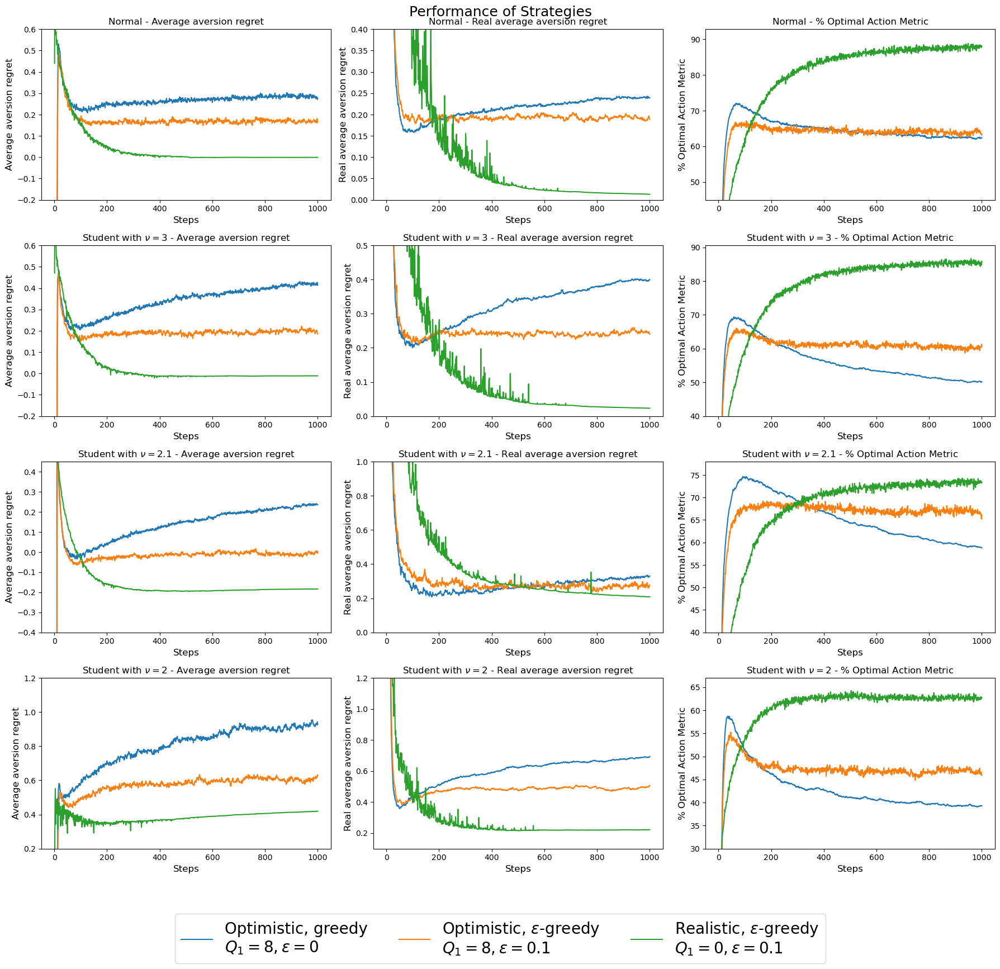

In [225]:
plot_strategies_results(metrics, labels, set_ylim, set_legend_outside=True)

In [233]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.5, 1.5)
        axes_flat[3 * i + 1].set_ylim(0.1, 1)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.05, 0.7)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.3, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(40, None)

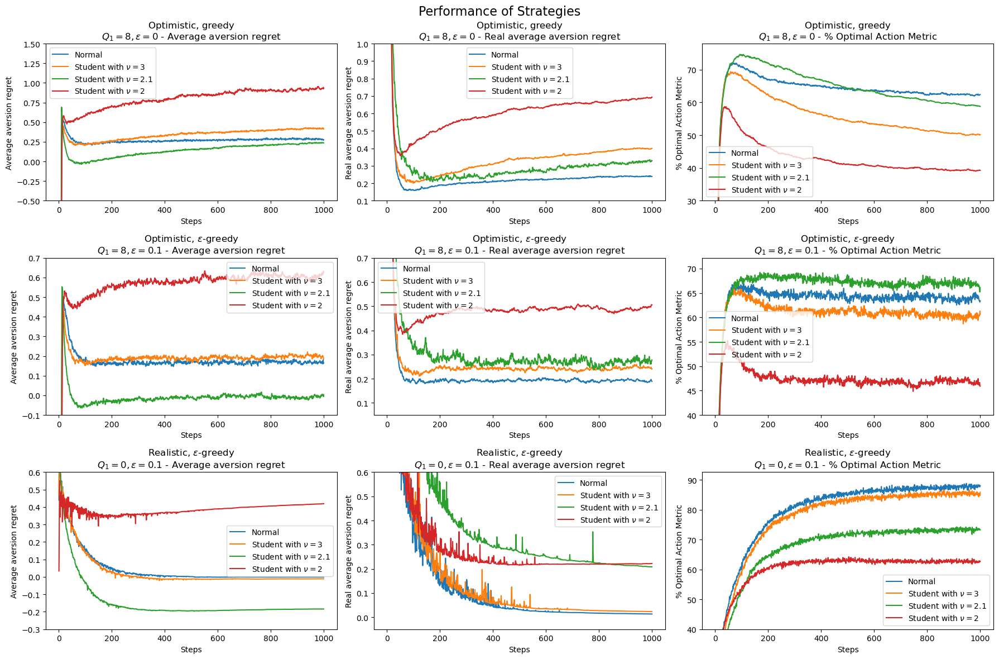

In [234]:
plot_distributions_results(metrics, labels, set_label_ylim)

### Subjective case

In [100]:
metrics = compare_subjective_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal


100%|██████████| 2000/2000 [06:07<00:00,  5.44it/s]


Student with $\nu=3$


100%|██████████| 2000/2000 [06:18<00:00,  5.28it/s]


Student with $\nu=2.1$


100%|██████████| 2000/2000 [06:15<00:00,  5.33it/s]


Student with $\nu=2$


100%|██████████| 2000/2000 [06:19<00:00,  5.27it/s]


In [101]:
save_new_metrics(metrics, 'positive_init_subjective_test')

In [47]:
all_metrics = load_all_metrics()

In [50]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.4)
        axes_flat[3 * i + 2].set_ylim(45, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.5)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.45)
        axes_flat[3 * i + 1].set_ylim(0, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 1.2)
        axes_flat[3 * i + 1].set_ylim(0.1, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)

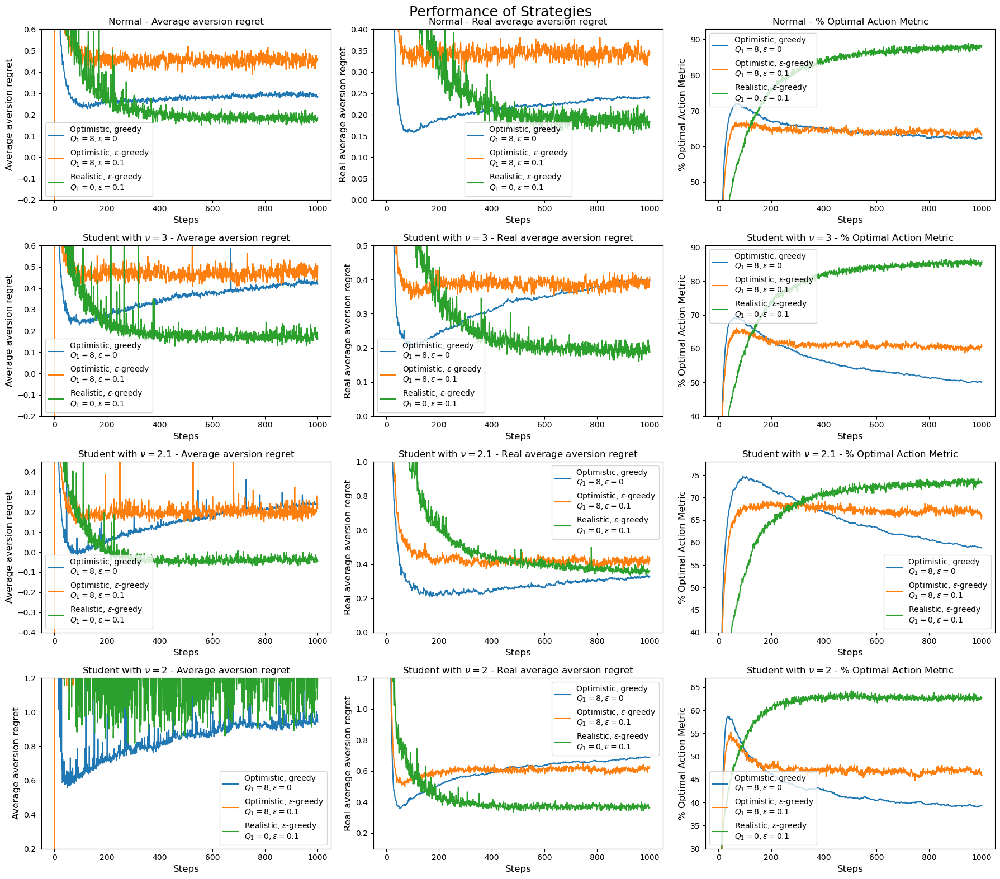

In [51]:
plot_strategies_results(all_metrics['positive_init_subjective_test'], labels, set_ylim, set_legend_outside=False)

In [105]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.5, 1.5)
        axes_flat[3 * i + 1].set_ylim(0.1, 1)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.05, 0.7)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.3, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(40, None)

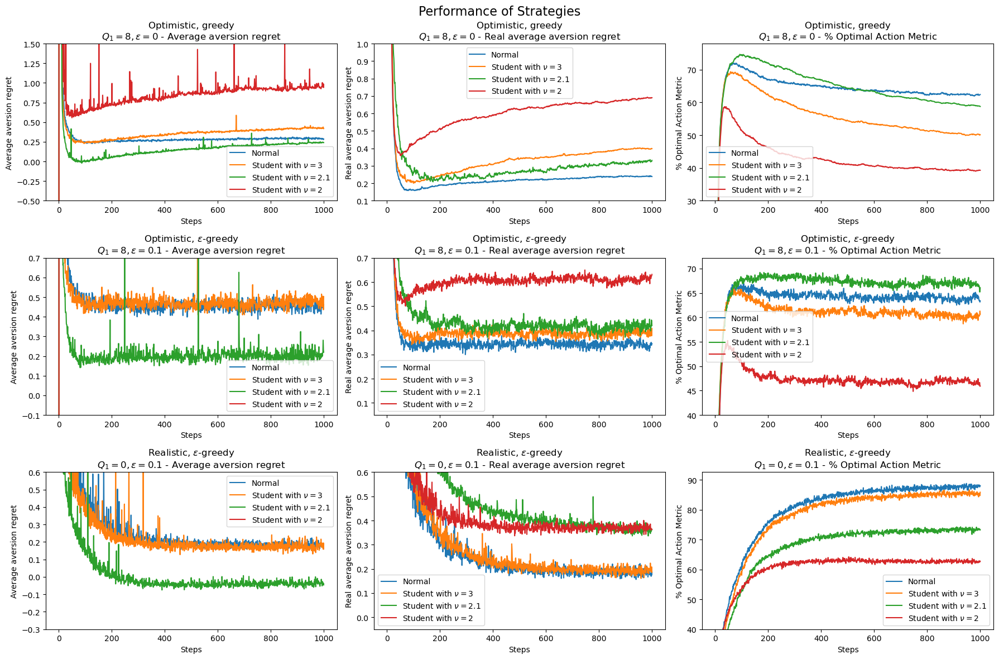

In [106]:
plot_distributions_results(all_metrics['positive_init_subjective_test'], labels, set_label_ylim)

## Upper-Confidence-Bound Action Selection

In [73]:
class UCB(AversionStrategy):
    def __init__(self, num_arms, c=2, step_size=lambda count: 1 / count, aversion=1., experimental=False):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.c = c  # Exploration parameter
        self.t = 0 # time
        self.experimental = experimental # Experimental feature for testing confidence bound for variance

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.t += 1  # Track total number of steps taken
        # Avoid division by zero by adding a small constant to the denominator
        return np.random.choice(np.arange(self.num_arms), p=self.probs), self.probs
    
    def update(self, arm, reward):
        self._update_counts_q_and_s_values(arm, reward)

        safe_counts = np.maximum(self.counts, 0.001)  # Ensure no element is zero
        q_values_upper_bounds = self.q_values + self.c * np.sqrt(np.log(self.t) / safe_counts)
        self.probs = get_optimal_probs(q_values_upper_bounds, self.s_values, self.aversion)
        self.probs /= np.sum(self.probs)
        

In [586]:
strategies = [UCB, EpsilonGreedy]
strategies_params = [{'c': 2}, {'epsilon': 0.1}]

In [237]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [84]:
labels = [r"UCB $c=2$", r"$\epsilon$-greedy, $\epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.45)
        axes_flat[3 * i + 1].set_ylim(0.1, 1.25)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 0.8)
        axes_flat[3 * i + 1].set_ylim(0.1, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)

In [241]:
save_new_metrics(metrics, 'UCB_test')

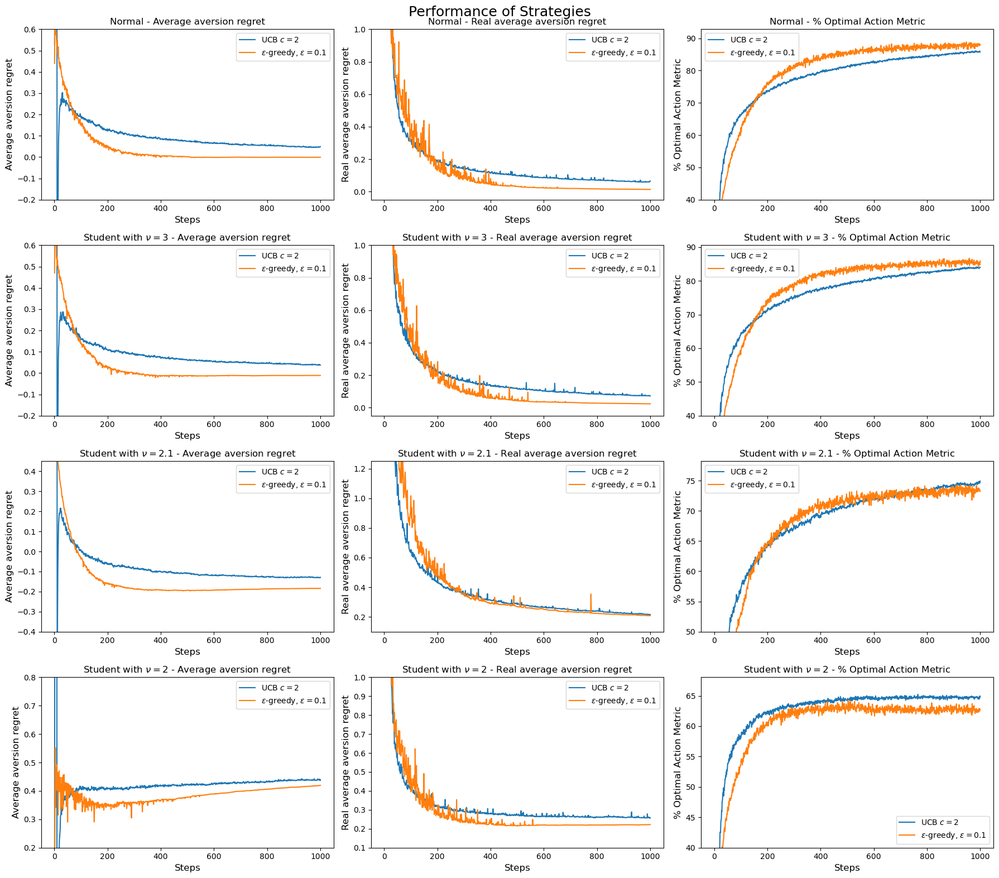

In [121]:
plot_strategies_results(all_metrics['UCB_test'], labels, set_ylim)

In [122]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.5, 1)
        axes_flat[3 * i + 1].set_ylim(-0.1, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.7)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.5)
        axes_flat[3 * i + 2].set_ylim(30, None)

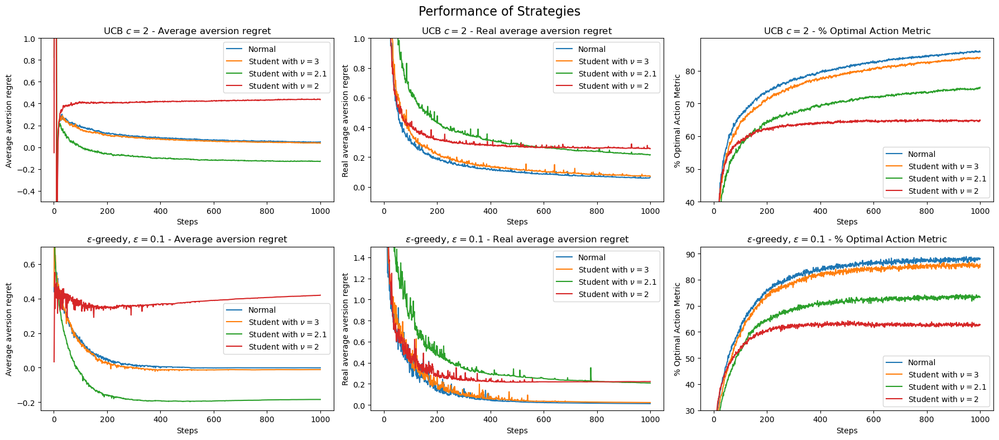

In [124]:
plot_distributions_results(all_metrics['UCB_test'], labels, set_label_ylim)

In [587]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, UCB, {'c': 2}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [05:57<00:00,  5.60it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:01<00:00,  5.53it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:00<00:00,  5.54it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:03<00:00,  5.50it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:06<00:00,  5.45it/s]


aversion: 1


100%|██████████| 2000/2000 [06:10<00:00,  5.40it/s]


aversion: 2


100%|██████████| 2000/2000 [06:09<00:00,  5.42it/s]


aversion: 4


100%|██████████| 2000/2000 [06:15<00:00,  5.32it/s]


aversion: 10


100%|██████████| 2000/2000 [06:13<00:00,  5.35it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [06:12<00:00,  5.36it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:18<00:00,  5.29it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:17<00:00,  5.30it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:21<00:00,  5.24it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:19<00:00,  5.27it/s]


aversion: 1


100%|██████████| 2000/2000 [06:23<00:00,  5.21it/s]


aversion: 2


100%|██████████| 2000/2000 [06:27<00:00,  5.17it/s]


aversion: 4


100%|██████████| 2000/2000 [06:28<00:00,  5.14it/s]


aversion: 10


100%|██████████| 2000/2000 [06:35<00:00,  5.06it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [06:48<00:00,  4.90it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:56<00:00,  4.80it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:40<00:00,  4.99it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:23<00:00,  5.22it/s]


aversion: 0.6


100%|██████████| 2000/2000 [07:28<00:00,  4.46it/s]


aversion: 1


100%|██████████| 2000/2000 [07:36<00:00,  4.39it/s]


aversion: 2


100%|██████████| 2000/2000 [06:46<00:00,  4.92it/s]


aversion: 4


100%|██████████| 2000/2000 [06:27<00:00,  5.16it/s]


aversion: 10


100%|██████████| 2000/2000 [06:29<00:00,  5.13it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [06:13<00:00,  5.36it/s]


aversion: 0.05


100%|██████████| 2000/2000 [06:19<00:00,  5.28it/s]


aversion: 0.12


100%|██████████| 2000/2000 [06:21<00:00,  5.25it/s]


aversion: 0.3


100%|██████████| 2000/2000 [06:47<00:00,  4.91it/s]


aversion: 0.6


100%|██████████| 2000/2000 [06:37<00:00,  5.03it/s]


aversion: 1


100%|██████████| 2000/2000 [06:24<00:00,  5.21it/s]


aversion: 2


100%|██████████| 2000/2000 [06:57<00:00,  4.79it/s]


aversion: 4


100%|██████████| 2000/2000 [07:05<00:00,  4.70it/s]


aversion: 10


100%|██████████| 2000/2000 [06:51<00:00,  4.86it/s]


In [588]:
save_new_metrics(aversion_metrics, 'ucb_aversions_test')

In [589]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

In [269]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.75)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 2)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.75)

In [125]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i].set_ylim(-1, 1)
    axes_flat[3 * i + 2].set_ylim(30, None)
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(None, 0.5)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(None, 0.4)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(None, 0.5)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.75)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-0.75, 0.75)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2.5)
    elif i == 5:
        axes_flat[3 * i].set_ylim(-0.75, 0.5)
        axes_flat[3 * i + 1].set_ylim(-0.1, 4)
        

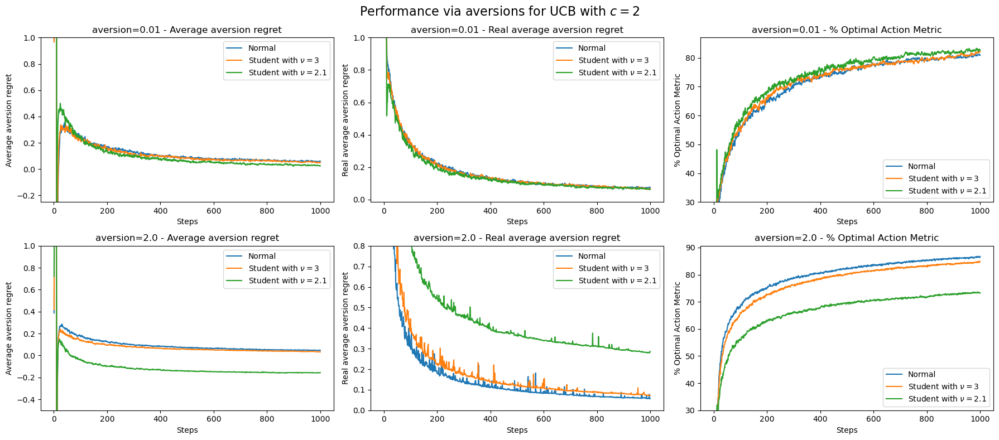

In [128]:
plot_results_via_aversions(all_metrics['ucb_aversions_test'], aversions, r"UCB with $c=2$", set_label_ylim, aversion_ids=[0, 6])

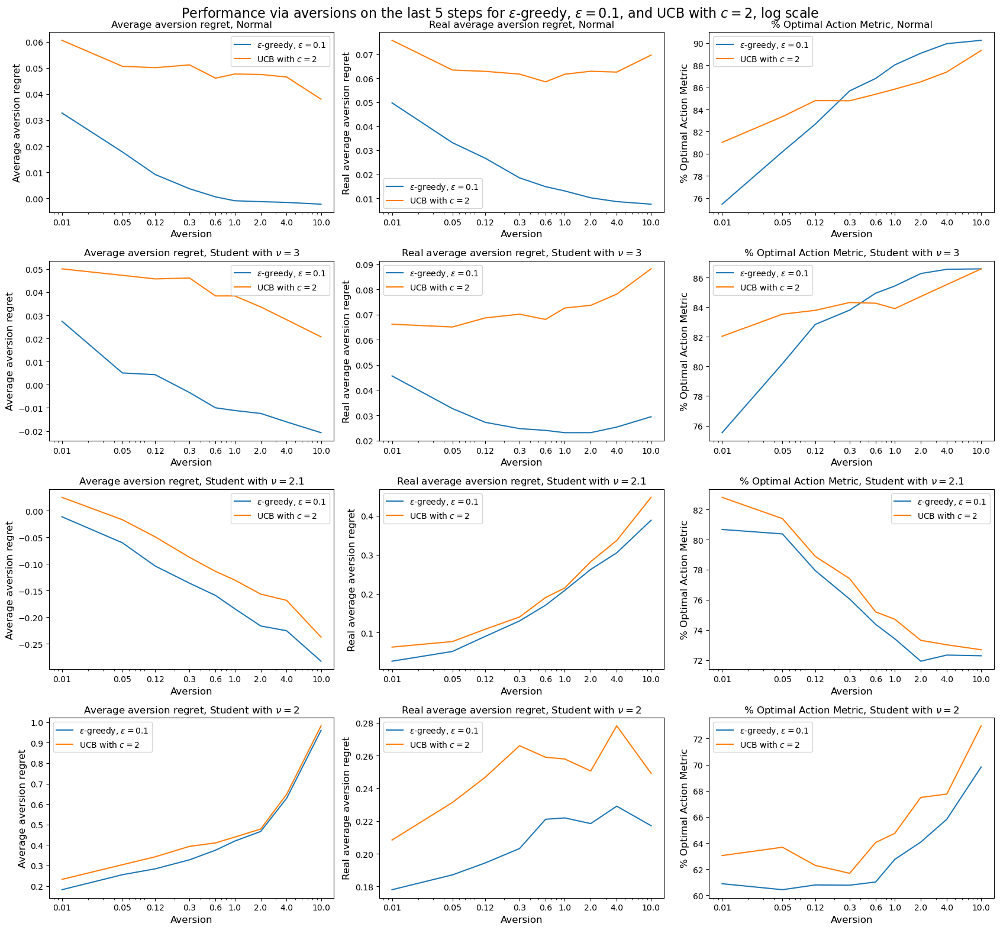

In [283]:
strategies_names = [r"$\epsilon$-greedy, $\epsilon = 0.1$", r"UCB with $c=2$"]
folders_names = ['eps_greedy_aversions_test', 'ucb_aversions_test']
plot_aversion_comparison_between_strategies(strategies_names=strategies_names, folders_names=folders_names, aversions=aversions)

In [146]:
bandit_tester = AversionBanditTester(Student, UCB, {'mu': 3}, {'c': 2,  'aversion': 0.01},  num_arms=num_arms, test_num=2000)
metrics1 = bandit_tester.test()
bandit_tester = AversionBanditTester(Student, EpsilonGreedy, {'mu': 3}, {'epsilon': 0.1,  'aversion': 0.01},  num_arms=num_arms, test_num=2000)
metrics2 = bandit_tester.test()

  0%|          | 0/2000 [00:00<?, ?it/s]

100%|██████████| 2000/2000 [06:51<00:00,  4.87it/s]


mean 0.06618204083508158
var 0.01995028308865035
opt_actions 0.8203464277043148

mean 0.04564616449131387
var 0.020221451078938812
opt_actions 0.7552835267445829


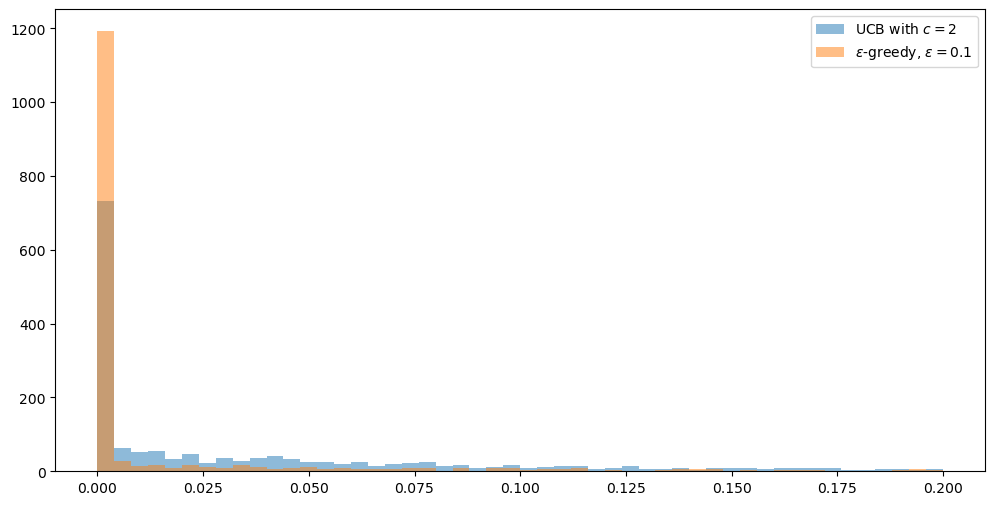

In [160]:
plt.figure(figsize=(12,6))
metric_name = 'last_real_regrets'

plt.hist(metrics1[metric_name], bins=50, alpha=0.5, range=(0, 0.2))
print("mean",np.mean(metrics1[metric_name]))
print("var", np.var(metrics1[metric_name]))
print("opt_actions", np.mean(metrics1['optimal_actions'][-5:]))
print()

plt.hist(metrics2[metric_name], bins=50, alpha=0.5, range=(0, 0.2))
print("mean", np.mean(metrics2[metric_name]))
print("var", np.var(metrics2[metric_name]))
print("opt_actions", np.mean(metrics2['optimal_actions'][-5:]))

strategies_names = [r"UCB with $c=2$", r"$\epsilon$-greedy, $\epsilon = 0.1$"]
plt.legend(strategies_names)
plt.show()

### Subjective version

In [74]:
save_new_metrics(all_metrics['UCB_test'], 'UCB_subjective_test')

In [75]:
all_metrics = load_all_metrics()

In [81]:
for distribution in all_metrics['UCB_subjective_test'].keys():
    for metric in all_metrics['UCB_subjective_test'][distribution].keys():
        all_metrics['UCB_subjective_test'][distribution][metric][1] = all_metrics['eps_greedy_subjective_test'][distribution][metric][2]

In [82]:
save_new_metrics(all_metrics['UCB_subjective_test'], 'UCB_subjective_test')

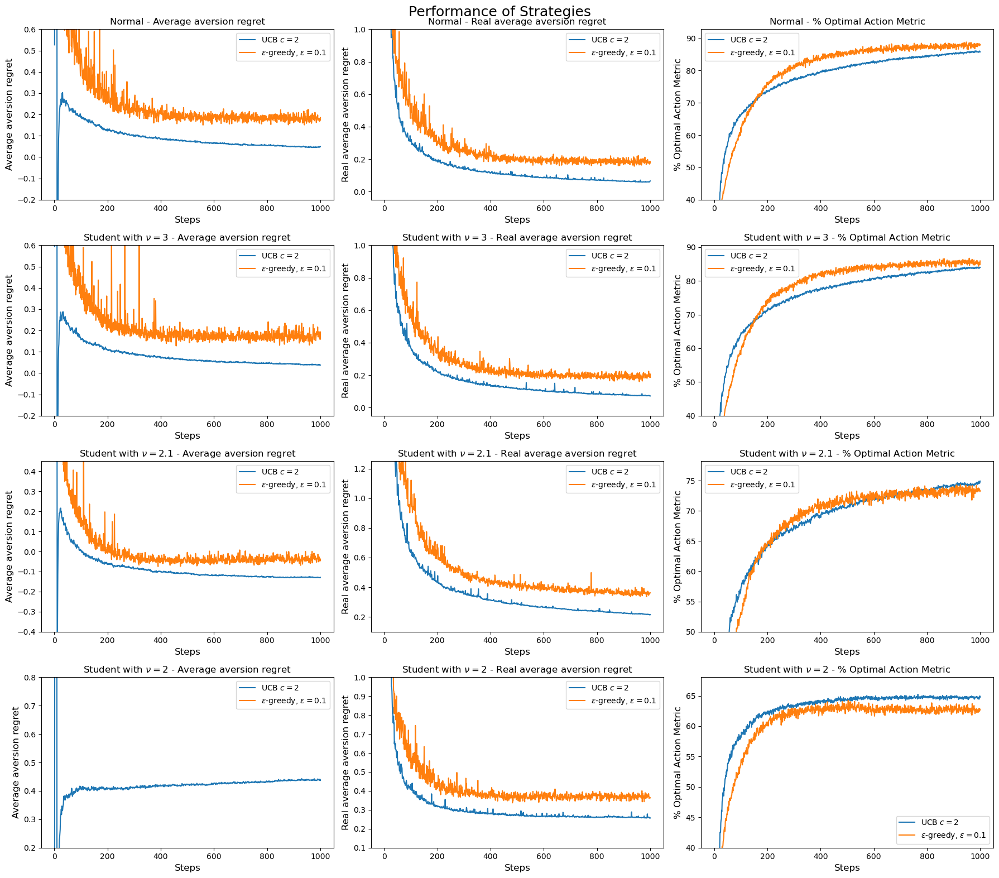

In [85]:
plot_strategies_results(all_metrics['UCB_subjective_test'],
                        labels,
                        set_ylim)

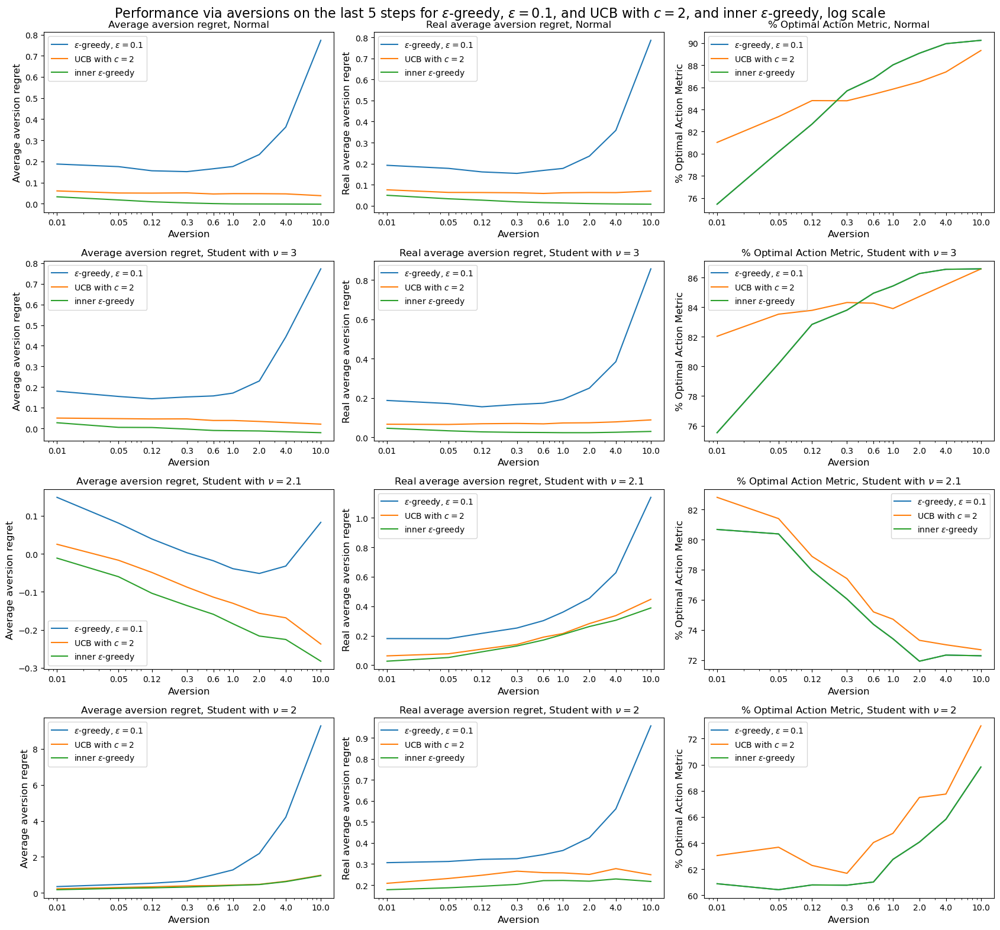

In [109]:
strategies_names = [r"$\epsilon$-greedy, $\epsilon = 0.1$", r"UCB with $c=2$", r"inner $\epsilon$-greedy"]
folders_names = ['eps_greedy_subjective_aversions_test', 'ucb_aversions_test', 'eps_greedy_aversions_test']
plot_aversion_comparison_between_strategies(strategies_names=strategies_names, folders_names=folders_names, aversions=aversions)

## Gradient bandits

### Old gradient bandit

In [163]:
class GradientBandit(AversionStrategy):
    def __init__(self, num_arms, baseline=True, alpha=0.1, step_size=lambda x: 1 / x, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.h_values = np.zeros(self.num_arms)
        self.probs = np.zeros(self.num_arms)
        self.alpha = alpha
        self.has_baseline = baseline
        self.t = 0
        self.avg_q_values = 0
        self.avg_q_square_values = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.probs = np.exp(self.h_values) / np.sum(np.exp(self.h_values))
        return np.random.choice(self.num_arms, p=self.probs), self.probs

    def update(self, arm, reward):
    
        baseline = 0 if not self.has_baseline else self.avg_q_values -\
            2 * self.aversion * self.probs[arm] * (
                self.counts[arm] * self.q_square_values[arm] - 2 * self.q_values[arm] * self.avg_q_values +
                                   self.avg_q_square_values) / (self.counts[arm] + 1)

        self.t += 1
        new_q_value = self.q_values[arm] + self.step_size(self.counts[arm] + 1) * (reward - self.q_values[arm])
        new_q_square_value = self.q_square_values[arm] +\
            self.step_size(self.counts[arm] + 1) * (reward ** 2 - self.q_square_values[arm])
        new_s_value = 0 if self.counts[arm] == 0 else ((self.counts[arm] + 1) / self.counts[arm]) *\
            (new_q_square_value - new_q_value ** 2)
        aversion_reward = reward - 2 * self.aversion * self.probs[arm] * new_s_value

        delta_reward = aversion_reward - baseline
        self.h_values -= self.alpha * delta_reward * self.probs
        self.h_values[arm] += self.alpha * delta_reward
        self.h_values -= np.max(self.h_values)

        self._update_counts_q_and_s_values(arm, reward)

        self.avg_q_values += (self.step_size(self.t) * (reward - self.avg_q_values)) if self.has_baseline else 0
        self.avg_q_square_values += (self.step_size(self.t) * (reward ** 2 - self.avg_q_values)) if self.has_baseline else 0

In [105]:
loc_sampler = norm(loc=5, scale=1)
biased_distributions_params = [{'loc_sampler': loc_sampler},
                        {'mu': 3, 'loc_sampler': loc_sampler},
                        {'mu': 2.1, 'loc_sampler': loc_sampler},
                        {'mu': 2, 'loc_sampler': loc_sampler}]

In [106]:
strategies = [GradientBandit, GradientBandit, GradientBandit, GradientBandit]
strategies_params = [{'baseline': True, 'alpha': 0.1},
                     {'baseline': True, 'alpha': 0.4},
                     {'baseline': False, 'alpha': 0.1},
                     {'baseline': False, 'alpha': 0.4}]

In [164]:
metrics = compare_strategies(distributions, biased_distributions_params, distributions_names, strategies, strategies_params)

Normal


100%|██████████| 2000/2000 [05:32<00:00,  6.01it/s]


Student with $\nu=3$


100%|██████████| 2000/2000 [05:39<00:00,  5.89it/s]


Student with $\nu=2.1$


100%|██████████| 2000/2000 [05:50<00:00,  5.70it/s]


Student with $\nu=2$


100%|██████████| 2000/2000 [05:32<00:00,  6.02it/s]


In [165]:
save_new_metrics(metrics, "gradient_bandits_test")

In [166]:
labels = [r"$\alpha=0.1$, with baseline",
          r"$\alpha=0.4$, with baseline",
          r"$\alpha=0.1$, without baseline",
          r"$\alpha=0.4$, without baseline"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    # Special adjustments for the last row (Standard Cauchy)
    if key == "Standard Cauchy":
        axes_flat[2 * i].set_ylim(-25, 25)  # Set x-axis limits for average reward

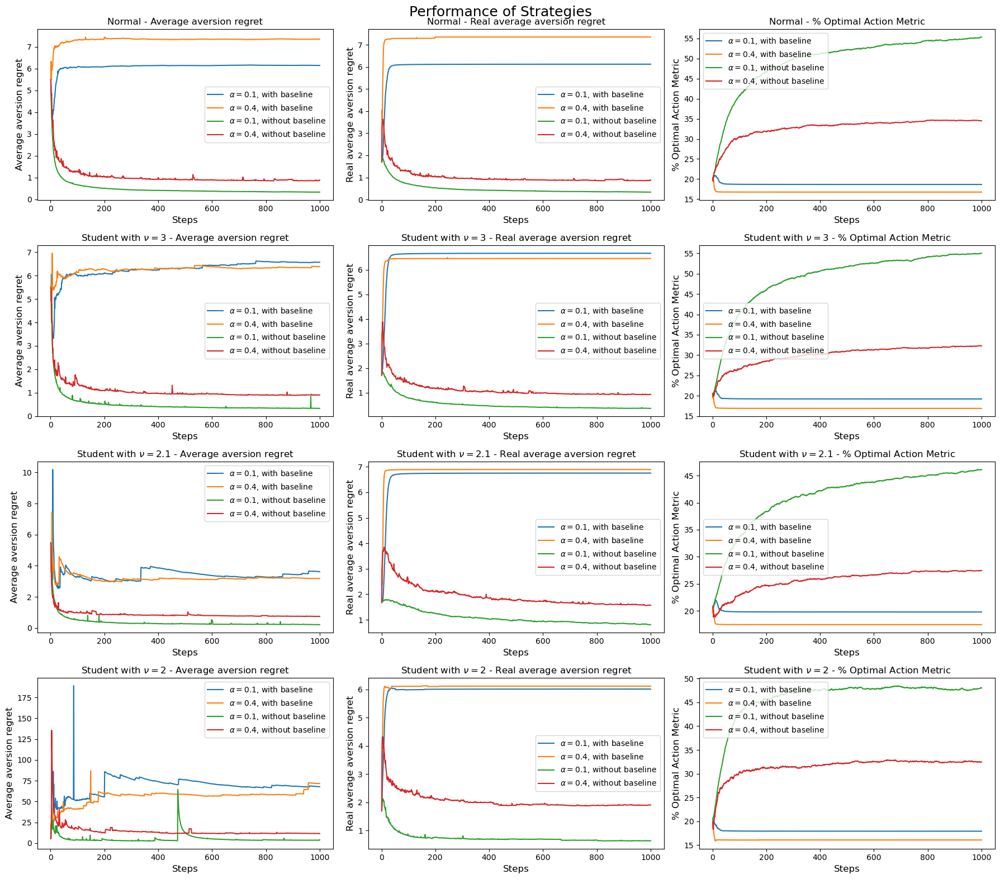

In [167]:
plot_strategies_results(metrics, labels, set_ylim)

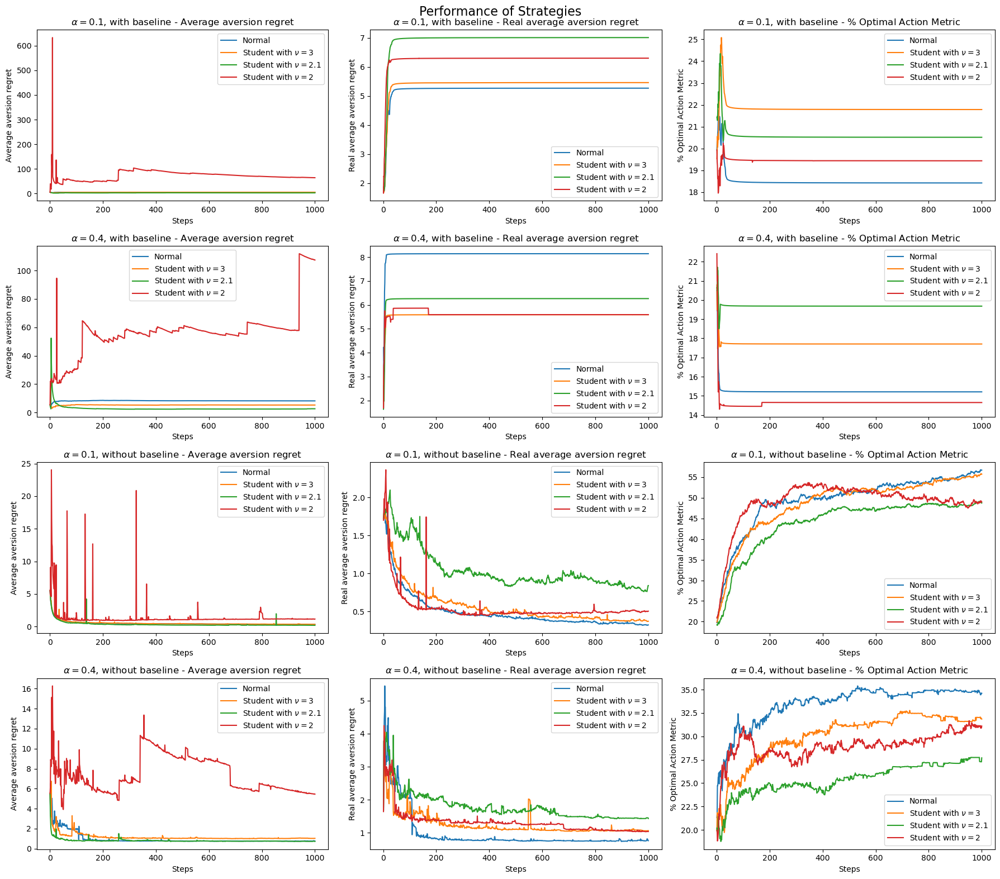

In [111]:
plot_distributions_results(metrics, labels)

### New gradient bandit

In [252]:
class NewGradientBandit(AversionStrategy):
    def __init__(self, num_arms, baseline=True, alpha=0.1, step_size=lambda x: 1 / x, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.h_values = np.zeros(self.num_arms)
        self.probs = np.zeros(self.num_arms)
        self.alpha = alpha
        self.has_baseline = baseline
        self.t = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.probs = np.exp(self.h_values) / np.sum(np.exp(self.h_values))
        return np.random.choice(self.num_arms, p=self.probs), self.probs

    def update(self, arm, reward):
    
        baseline = 0 if not self.has_baseline or self.t == 0 else\
            np.sum(self.counts * (self.q_values - 2 * self.aversion * self.probs * self.s_values)) / self.t

        self.t += 1
        self._update_counts_q_and_s_values(arm, reward)
        aversion_reward = self.q_values[arm] - 2 * self.aversion * self.probs[arm] * self.s_values[arm]

        delta_reward = aversion_reward - baseline
        self.h_values -= self.alpha * delta_reward * self.probs
        self.h_values[arm] += self.alpha * delta_reward
        self.h_values -= np.max(self.h_values)


In [254]:
loc_sampler = norm(loc=5, scale=1)
biased_distributions_params = [{'loc_sampler': loc_sampler},
                        {'mu': 3, 'loc_sampler': loc_sampler},
                        {'mu': 2.1, 'loc_sampler': loc_sampler},
                        {'mu': 2, 'loc_sampler': loc_sampler}]

In [255]:
strategies = [NewGradientBandit, NewGradientBandit, NewGradientBandit, NewGradientBandit]
strategies_params = [{'baseline': True, 'alpha': 0.1},
                     {'baseline': True, 'alpha': 0.4},
                     {'baseline': False, 'alpha': 0.1},
                     {'baseline': False, 'alpha': 0.4}]

In [256]:
metrics = compare_strategies(distributions, biased_distributions_params, distributions_names, strategies, strategies_params)

Normal


100%|██████████| 2000/2000 [05:01<00:00,  6.63it/s]


Student with $\nu=3$


100%|██████████| 2000/2000 [05:51<00:00,  5.69it/s]


Student with $\nu=2.1$


100%|██████████| 2000/2000 [05:40<00:00,  5.87it/s]


Student with $\nu=2$


100%|██████████| 2000/2000 [05:44<00:00,  5.81it/s]


In [257]:
save_new_metrics(metrics, "new_gradient_bandits_test")

In [258]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

In [263]:
labels = [r"$\alpha=0.1$, with baseline",
          r"$\alpha=0.4$, with baseline",
          r"$\alpha=0.1$, without baseline",
          r"$\alpha=0.4$, without baseline"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.1, 2)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.5)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 2)
        axes_flat[3 * i + 1].set_ylim(-0.05, 2)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 2)
    elif i == 3:
        axes_flat[3 * i].set_ylim(None, 60)
    

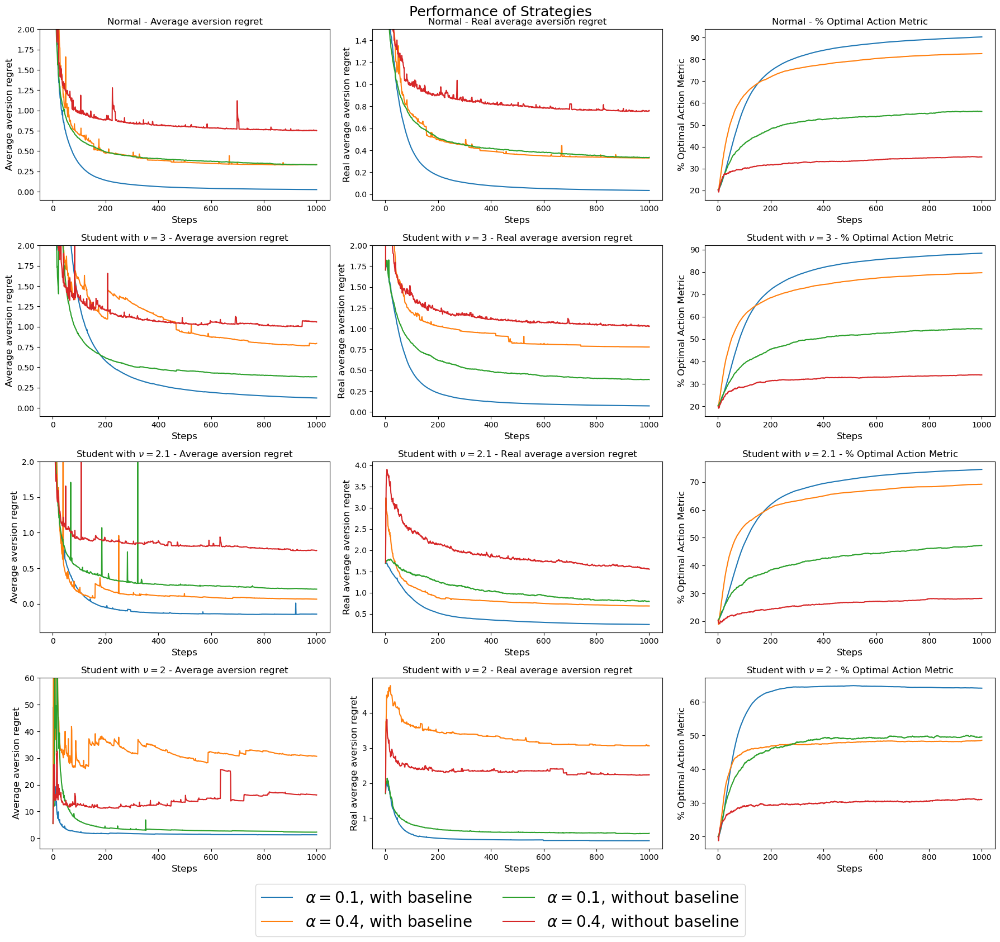

In [268]:
plot_strategies_results(all_metrics["new_gradient_bandits_test"], labels, set_ylim, set_legend_outside=True)

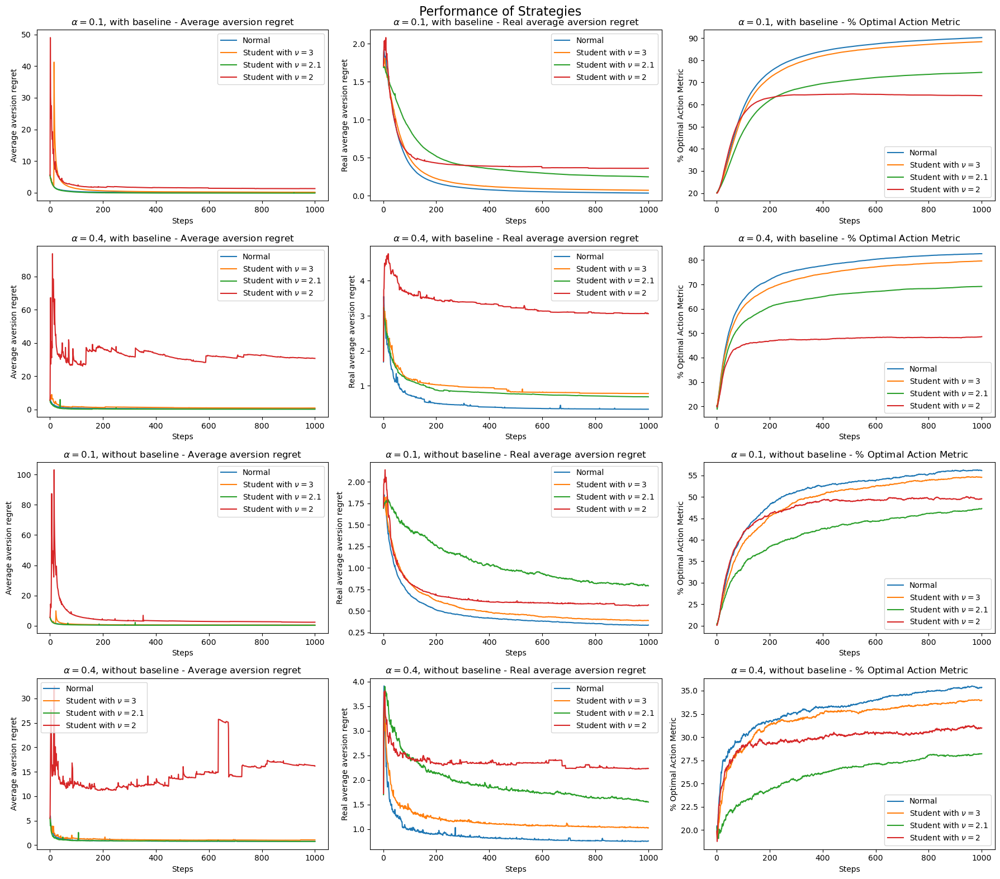

In [269]:
plot_distributions_results(all_metrics["new_gradient_bandits_test"], labels)

In [270]:
aversion_metrics = compare_aversions(distributions, biased_distributions_params, distributions_names, NewGradientBandit, {'baseline': True, 'alpha': 0.1}, aversions)

Normal
aversion: 0.01


100%|██████████| 2000/2000 [06:05<00:00,  5.48it/s]


aversion: 0.05


100%|██████████| 2000/2000 [33:16<00:00,  1.00it/s]    


aversion: 0.12


100%|██████████| 2000/2000 [05:34<00:00,  5.98it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:26<00:00,  6.12it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:31<00:00,  6.03it/s]


aversion: 1.0


100%|██████████| 2000/2000 [05:39<00:00,  5.90it/s]


aversion: 2.0


100%|██████████| 2000/2000 [05:28<00:00,  6.09it/s]


aversion: 4.0


100%|██████████| 2000/2000 [05:17<00:00,  6.29it/s]


aversion: 10.0


100%|██████████| 2000/2000 [05:16<00:00,  6.31it/s]


Student with $\nu=3$
aversion: 0.01


100%|██████████| 2000/2000 [05:34<00:00,  5.98it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:33<00:00,  6.00it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:31<00:00,  6.03it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:49<00:00,  5.72it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:46<00:00,  5.78it/s]


aversion: 1.0


100%|██████████| 2000/2000 [05:32<00:00,  6.02it/s]


aversion: 2.0


100%|██████████| 2000/2000 [05:32<00:00,  6.01it/s]


aversion: 4.0


100%|██████████| 2000/2000 [05:28<00:00,  6.08it/s]


aversion: 10.0


100%|██████████| 2000/2000 [05:30<00:00,  6.04it/s]


Student with $\nu=2.1$
aversion: 0.01


100%|██████████| 2000/2000 [05:33<00:00,  6.00it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:35<00:00,  5.96it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:32<00:00,  6.02it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:30<00:00,  6.05it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:30<00:00,  6.05it/s]


aversion: 1.0


100%|██████████| 2000/2000 [05:30<00:00,  6.05it/s]


aversion: 2.0


100%|██████████| 2000/2000 [05:31<00:00,  6.03it/s]


aversion: 4.0


100%|██████████| 2000/2000 [05:32<00:00,  6.01it/s]


aversion: 10.0


100%|██████████| 2000/2000 [05:29<00:00,  6.07it/s]


Student with $\nu=2$
aversion: 0.01


100%|██████████| 2000/2000 [05:32<00:00,  6.01it/s]


aversion: 0.05


100%|██████████| 2000/2000 [05:31<00:00,  6.03it/s]


aversion: 0.12


100%|██████████| 2000/2000 [05:31<00:00,  6.03it/s]


aversion: 0.3


100%|██████████| 2000/2000 [05:33<00:00,  6.00it/s]


aversion: 0.6


100%|██████████| 2000/2000 [05:30<00:00,  6.06it/s]


aversion: 1.0


100%|██████████| 2000/2000 [05:30<00:00,  6.06it/s]


aversion: 2.0


100%|██████████| 2000/2000 [05:28<00:00,  6.09it/s]


aversion: 4.0


100%|██████████| 2000/2000 [05:30<00:00,  6.06it/s]


aversion: 10.0


100%|██████████| 2000/2000 [05:28<00:00,  6.10it/s]


In [271]:
save_new_metrics(aversion_metrics, 'new_gradient_bandits_aversions_test')

In [272]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

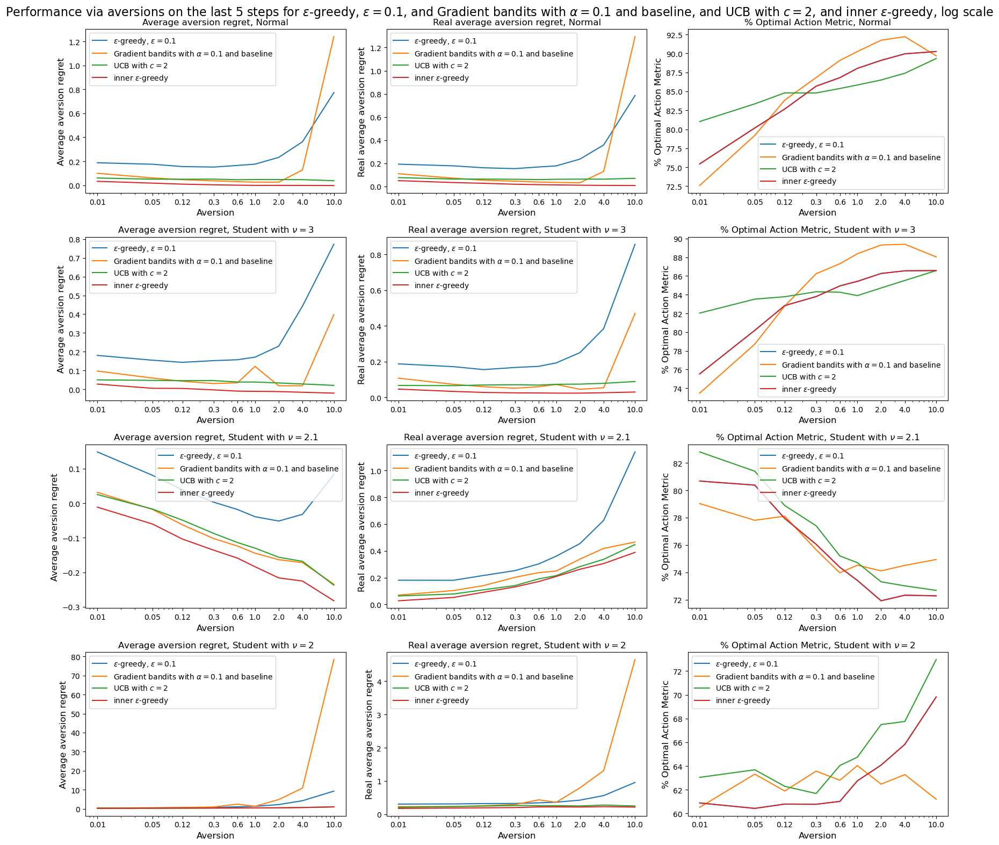

In [23]:
strategies_names = [r"$\epsilon$-greedy, $\epsilon = 0.1$", r"Gradient bandits with $\alpha=0.1$ and baseline", r"UCB with $c=2$", r"inner $\epsilon$-greedy"]
folders_names = ['eps_greedy_subjective_aversions_test', 'new_gradient_bandits_aversions_test', 'ucb_aversions_test', 'eps_greedy_aversions_test']
plot_aversion_comparison_between_strategies(strategies_names=strategies_names, folders_names=folders_names, aversions=aversions)

In [288]:
bandit_tester = AversionBanditTester(Gaussian, NewGradientBandit, {}, {'baseline': True, 'alpha': 0.1, 'aversion': 10},  num_arms=num_arms, test_num=2000)
metrics1 = bandit_tester.test()
bandit_tester = AversionBanditTester(Gaussian, EpsilonGreedy, {}, {'epsilon': 0.1,  'aversion': 10},  num_arms=num_arms, test_num=2000)
metrics2 = bandit_tester.test()

100%|██████████| 2000/2000 [06:13<00:00,  5.35it/s]


mean 0.2993025447052472
max 360.0650799662561
var 66.65528224189275
opt_actions 0.9231072647940151

mean 0.007544372617636152
max 0.24320271243509825
var 0.00013909657796571068
opt_actions 0.9024629649240572


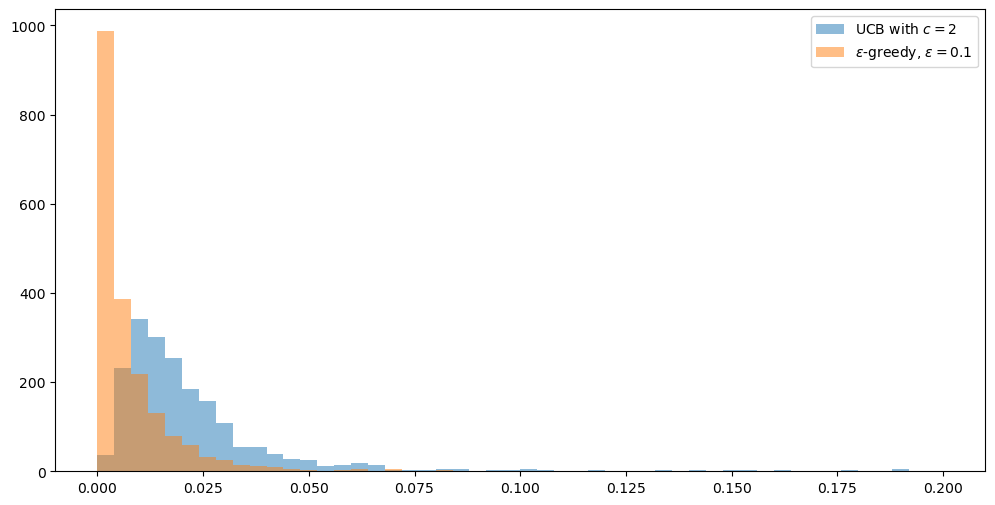

In [291]:
plt.figure(figsize=(12,6))
metric_name = 'last_real_regrets'

plt.hist(metrics1[metric_name], bins=50, alpha=0.5, range=(0, 0.2))
print("mean",np.mean(metrics1[metric_name]))
print("max", np.max(metrics1[metric_name]))
print("var", np.var(metrics1[metric_name]))
print("opt_actions", np.mean(metrics1['optimal_actions'][-5:]))
print()

plt.hist(metrics2[metric_name], bins=50, alpha=0.5, range=(0, 0.2))
print("mean", np.mean(metrics2[metric_name]))
print("max", np.max(metrics2[metric_name]))
print("var", np.var(metrics2[metric_name]))
print("opt_actions", np.mean(metrics2['optimal_actions'][-5:]))

strategies_names = [r"UCB with $c=2$", r"$\epsilon$-greedy, $\epsilon = 0.1$"]
plt.legend(strategies_names)
plt.show()